# Case study: Chronic Lymphocytic Leukemia Data

This ipython notebook is an adaption of the latest notebook https://github.com/theislab/single-cell-tutorial/ (Stand 4.11.2019) Introduction parts to the main sections were also taken from this tutorial.

Here, a CLL dataset from Rendeiro et al. is analysed with the goal of annotating celltype labels to expression profiles, using current best practices and common tools.

The raw expression data has been analyzed by Rendeiro et al. using seurat pipeline. This celltype labeled data has been provided and builds the data which our analysis is based on.

Initial testing of the pipeline was done with a subsample of this data, using only 10% of profiles for each celltype label.
Following the results of this pretest, we infered the decisions of excluding celltype labels 'malignant' and 'not_annotated' and skipping the preprocessing steps of batch correction and cell cycle scoring.

## Table of contents:

  * <a href=#Reading>1 Reading in the data</a>
  * <a href=#PPV>2 Pre-processing and visualization</a>
    * <a href=#QC>2.1 Quality Control</a>
    * <a href=#Normalization>2.2 Normalization</a> 
    * <a href=#Visualization>2.3 Visualization</a>
  * <a href=#CC>3 Downstream analysis</a>
    * <a href=#Clustering>3.1 Clustering</a>
    * <a href=#Markers>3.2 Marker genes & cluster annotation</a>

# 0. Loading the libraries

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import GProfiler

from rpy2.robjects import pandas2ri

In [2]:
resultfig_path = '../Results/figures/selection/'

# parameters for better quality in regards to poster/paper graphics
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
sc.settings.figdir=resultfig_path
sc.settings.file_format_figs='pdf'

sc.settings.plot_suffix='_selection'
sc.settings.autoshow=True
sc.settings.n_jobs=12


sc.set_figure_params(dpi=200, dpi_save=300, fontsize=10)
sc.logging.print_versions()

scanpy==1.4.2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.3 scipy==1.3.1 pandas==0.25.2 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1+4.bed07760 louvain==0.6.1 


In [3]:
# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
%load_ext rpy2.ipython

In [4]:
%%R
# Load all the R libraries we will be using in the notebook
library(scran)

# 1. Reading in the data

Here we read in the subset of the original data with selected celltypes.
Also we check the shape and distribution of observations.

In [5]:
fp = '../Data/selection/celltype_selection.h5ad'
adata = sc.read(fp, cache=True)

In [6]:
adata.shape

(15784, 22021)

In [7]:
# Checking observation distribution
print(adata.obs['patient.sample'].value_counts()/sum(adata.obs['patient.sample'].value_counts()))
print(adata.obs['cell_type'].value_counts()/sum(adata.obs['cell_type'].value_counts()))

5150    0.354156
5030    0.251837
6000    0.155791
8120    0.050177
6030    0.047326
6280    0.045743
5000    0.029967
8000    0.024455
6120    0.014888
1120    0.009820
8030    0.009187
1000    0.006652
Name: patient.sample, dtype: float64
cd8+          0.533452
mono          0.141472
unassigned    0.120882
cd4+          0.114736
nk            0.064876
nlc           0.024582
Name: cell_type, dtype: float64


<a id="PPV"></a>

# 2 Pre-processing and visualization

In [ ]:
Following 

<a id="QC"></a>

## 2.1 Quality control

> Data quality control can be split into cell QC and gene QC. Typical quality measures for assessing the quality of a cell include the number of molecule counts (UMIs), the number of expressed genes, and the fraction of counts that are mitochondrial. A high fraction of mitochondrial reads being picked up can indicate cell stress, as there is a low proportion of nuclear mRNA in the cell. It should be noted that high mitochondrial RNA fractions can also be biological signals indicating elevated respiration.

In [8]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

mt_gene_mask = [gene.startswith('MT-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

In [9]:
a = list(adata.obs['n_counts'])
print("Counts range from ", min(a), " to ", max(a))

Counts range from  253.0  to  11982.0


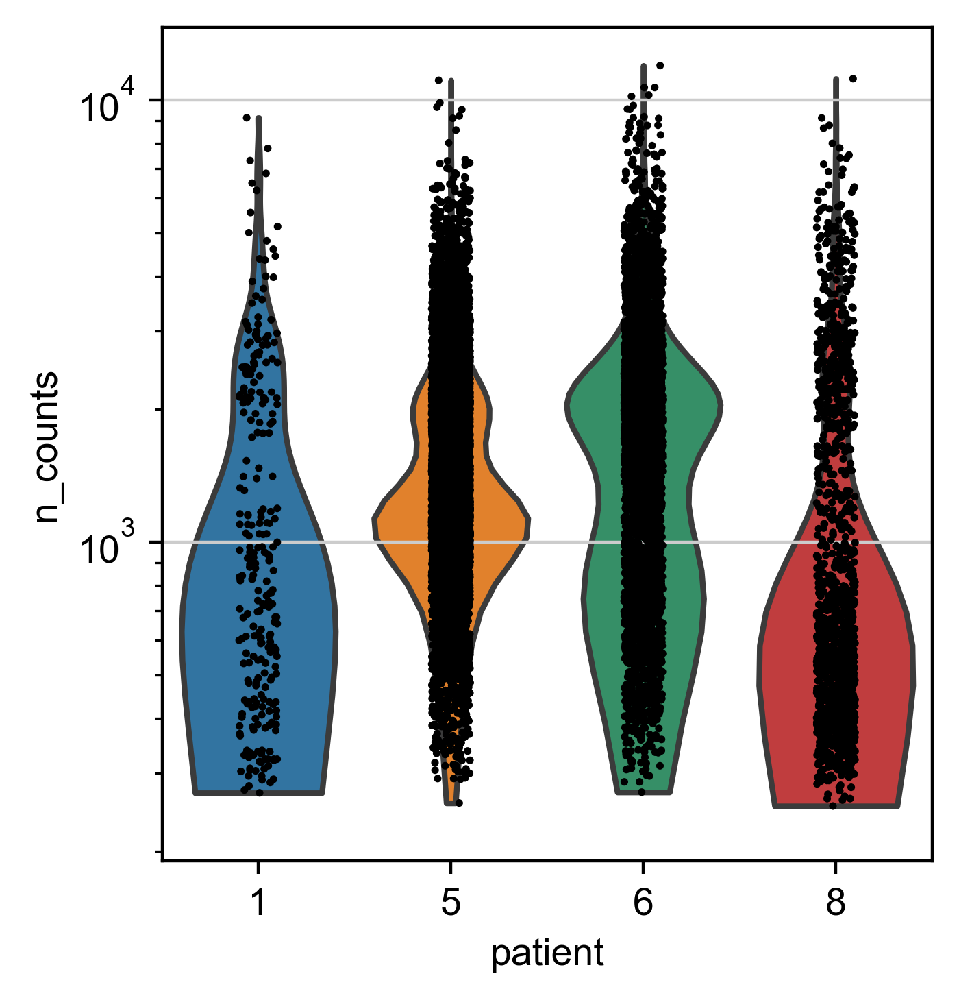

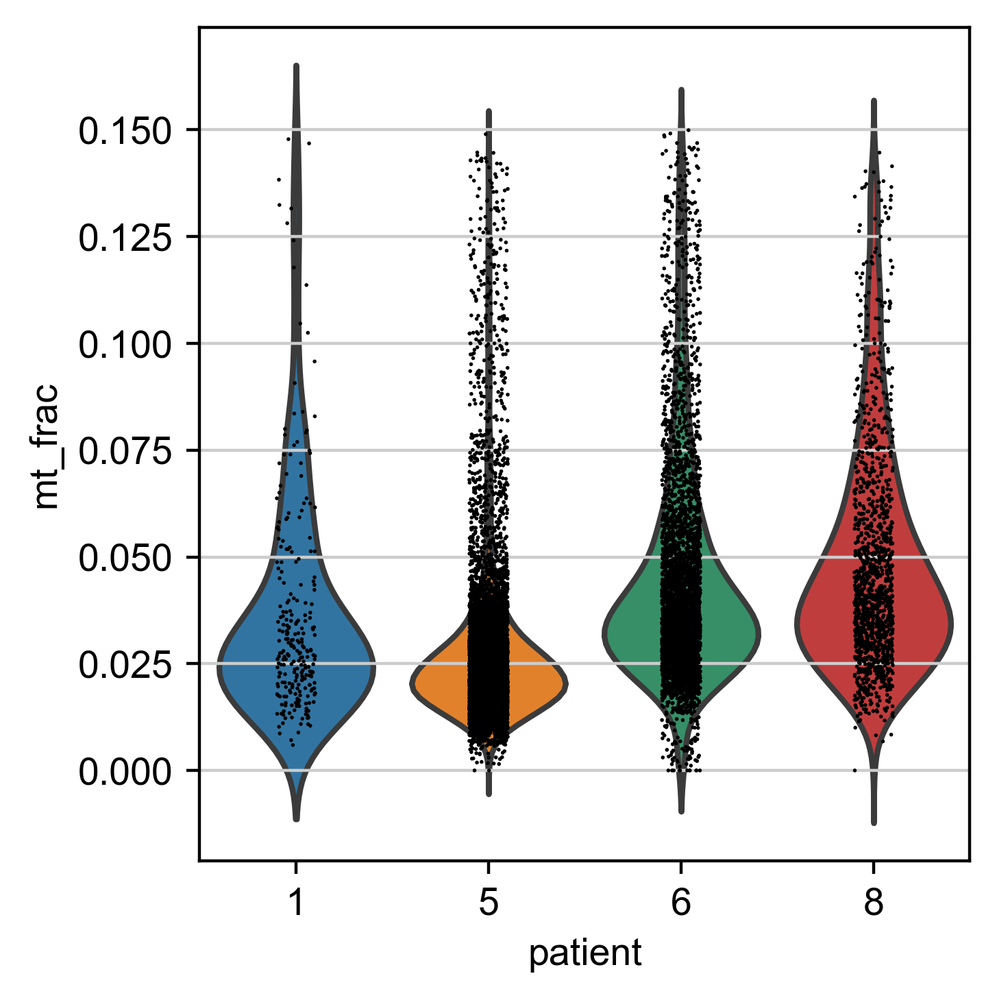

In [10]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata, 'n_counts', groupby='patient', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata, 'mt_frac', groupby='patient')

saving figure to file ../Results/figures/selection/violin_patientsample_counts_selection.pdf


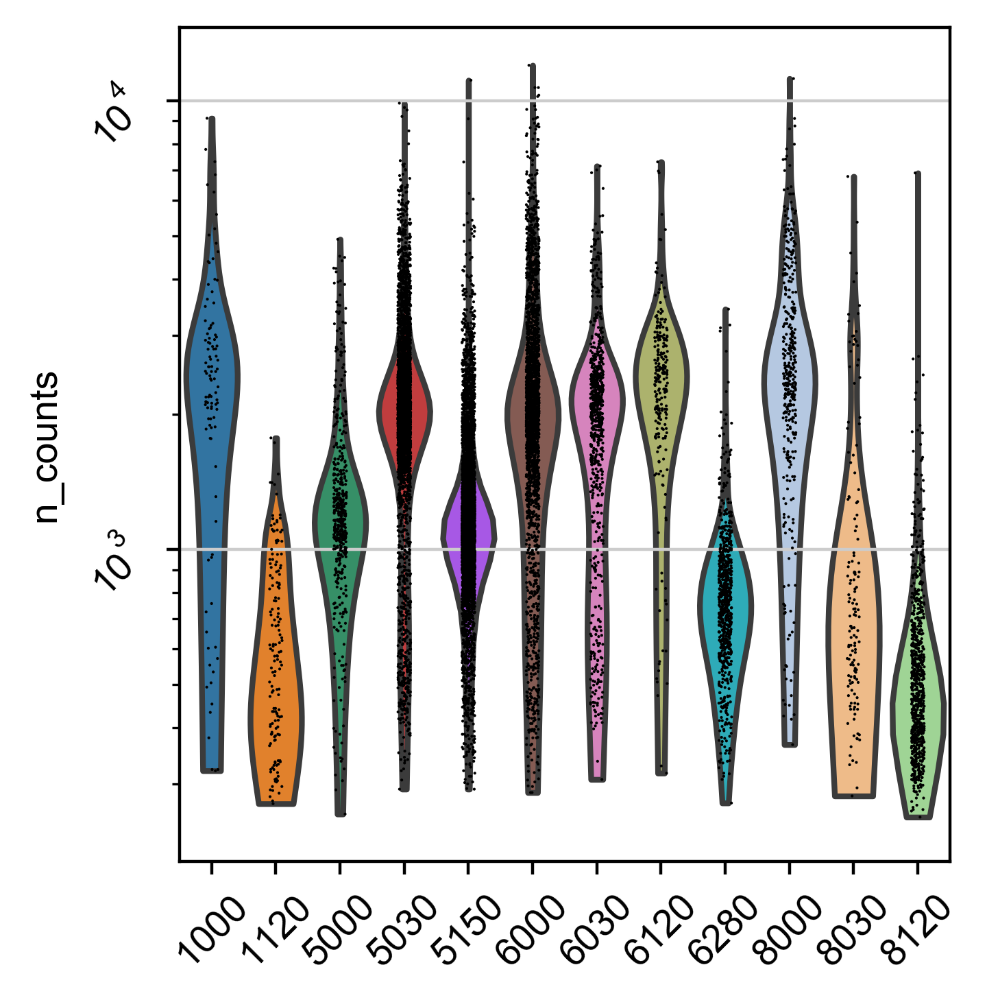

saving figure to file ../Results/figures/selection/violin_patientsample_mtfrac_selection.pdf


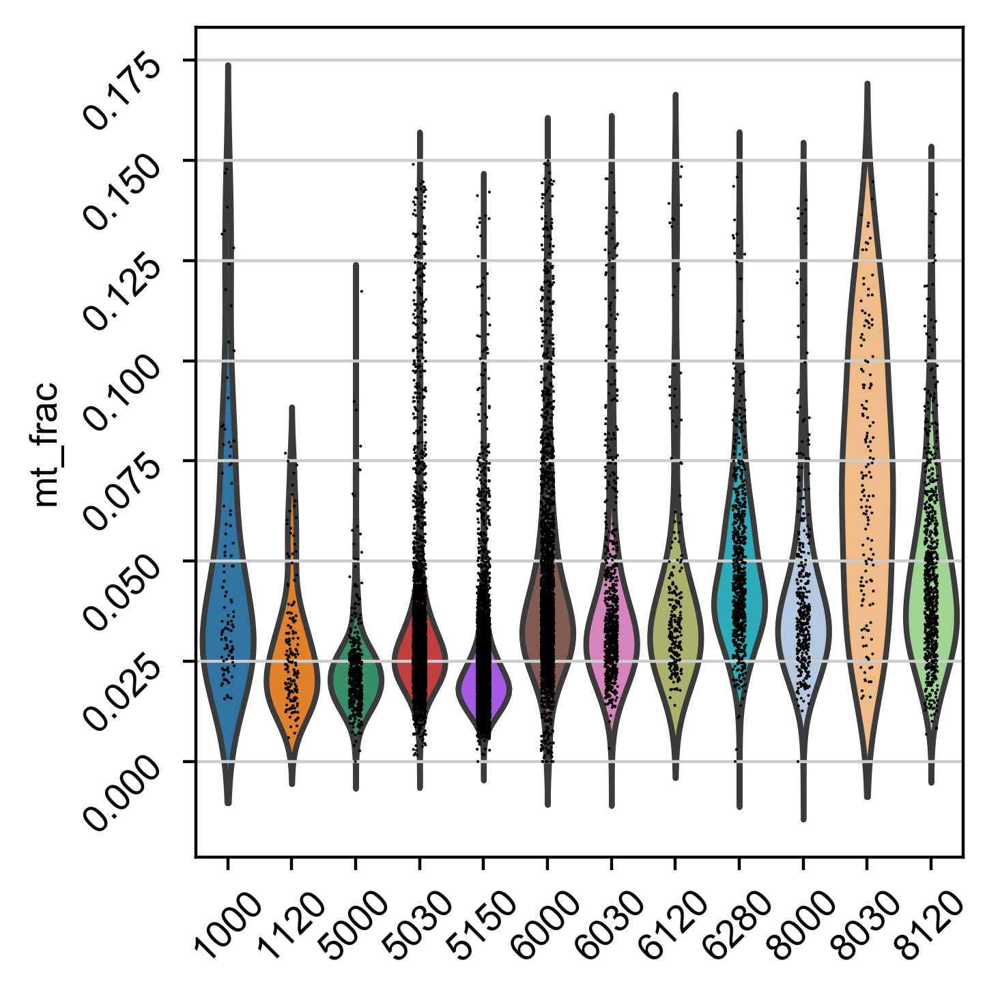

In [11]:
# Quality control - plot QC metrics
#Sample quality plots

t1 = sc.pl.violin(adata, 'n_counts', groupby='patient.sample', size=0.75, rotation=45, log=True, cut=0, save='_patientsample_counts')
t2 = sc.pl.violin(adata, 'mt_frac', groupby='patient.sample', size=0.75, rotation=45, save='_patientsample_mtfrac')

C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\scanpy\plotting\_anndata.py:311: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  x_arr = adata._get_obs_array(x, use_raw=use_raw, layer=layers[0])
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\anndata\core\anndata.py:1475: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarning
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\scanpy\plotting\_anndata.py:312: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  y_arr = adata._get_obs_array(y, use_raw=use_raw, layer=layers[1])
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\anndata\core\anndata.py:1475: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarn

saving figure to file ../Results/figures/selection/scatter_countsVSgenes_selection.pdf


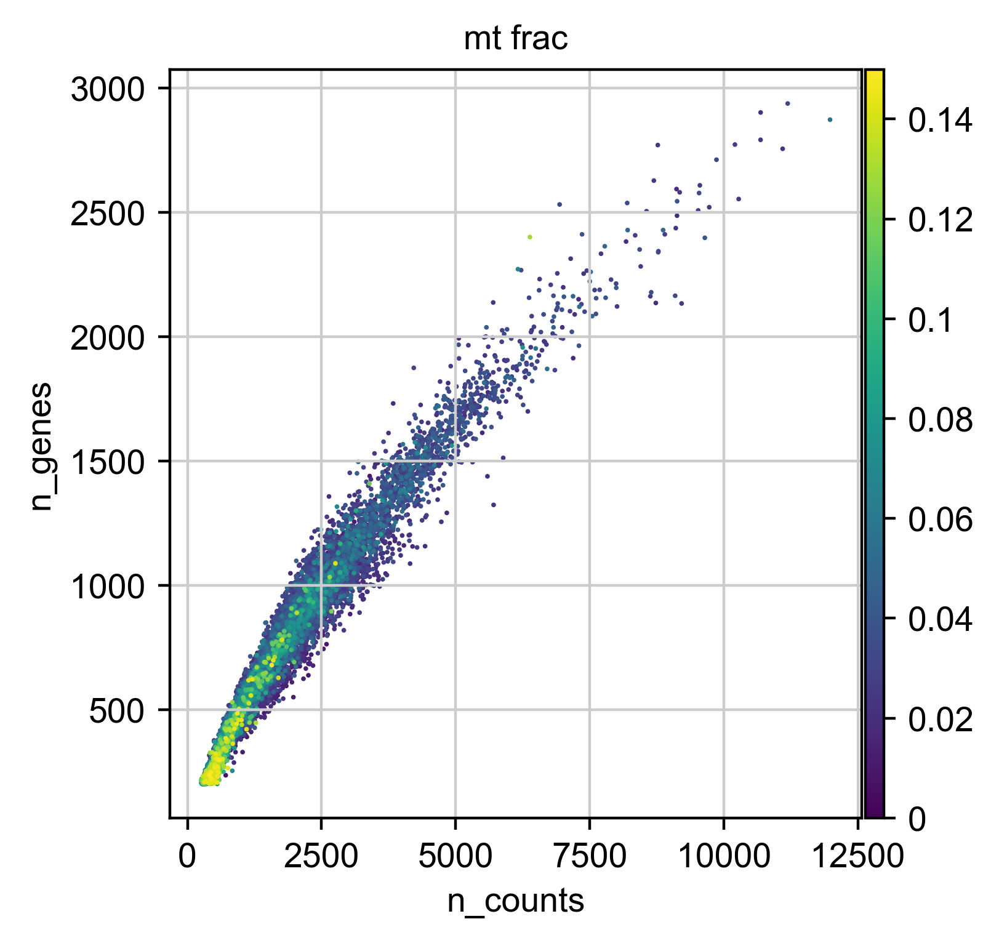

C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\scanpy\plotting\_anndata.py:311: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  x_arr = adata._get_obs_array(x, use_raw=use_raw, layer=layers[0])
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\anndata\core\anndata.py:1475: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarning
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\scanpy\plotting\_anndata.py:312: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  y_arr = adata._get_obs_array(y, use_raw=use_raw, layer=layers[1])
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\anndata\core\anndata.py:1475: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarn

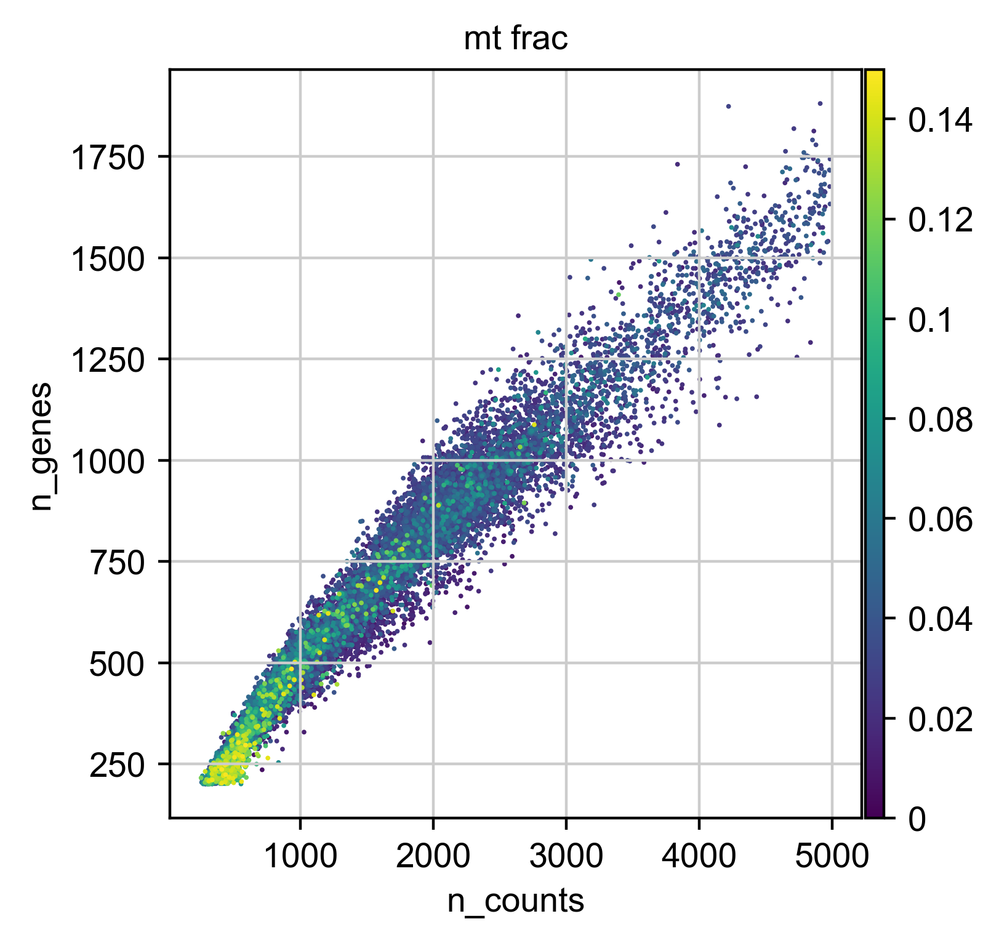

In [15]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', color='mt_frac', save='_countsVSgenes')
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<5000], 'n_counts', 'n_genes', color='mt_frac')

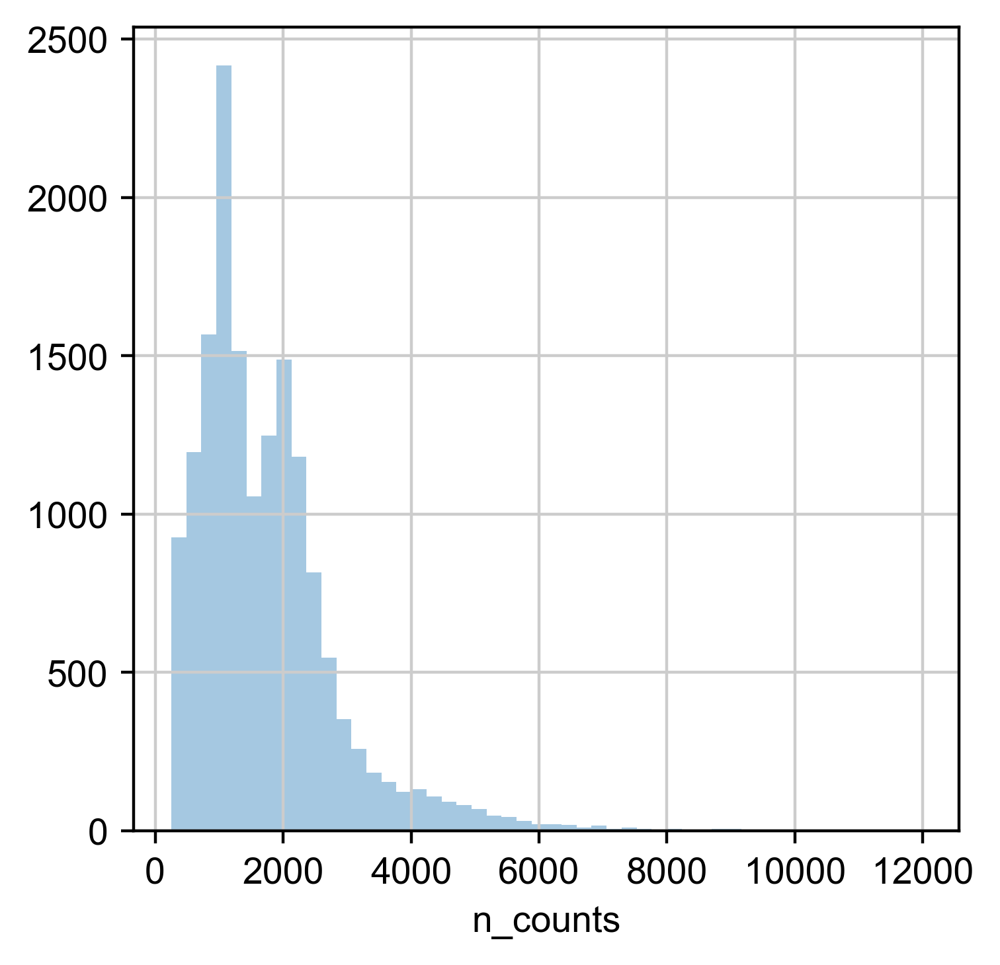

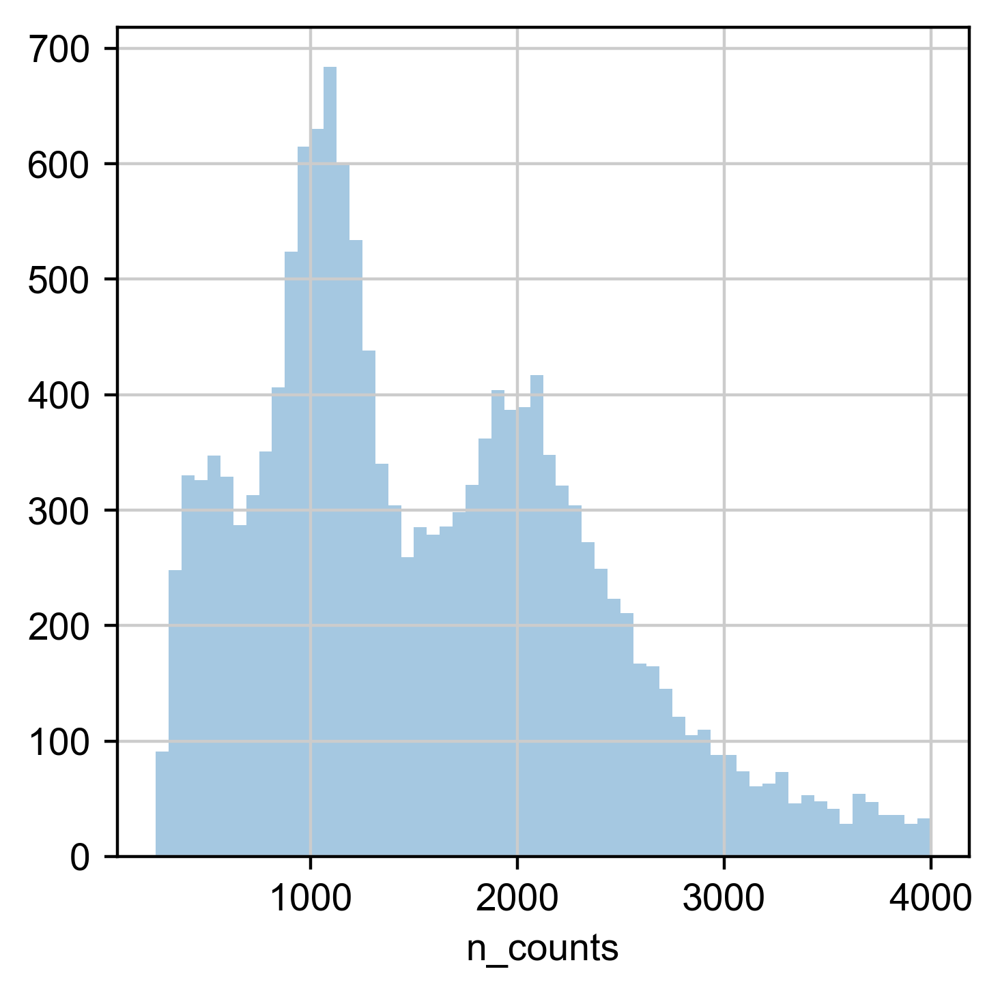

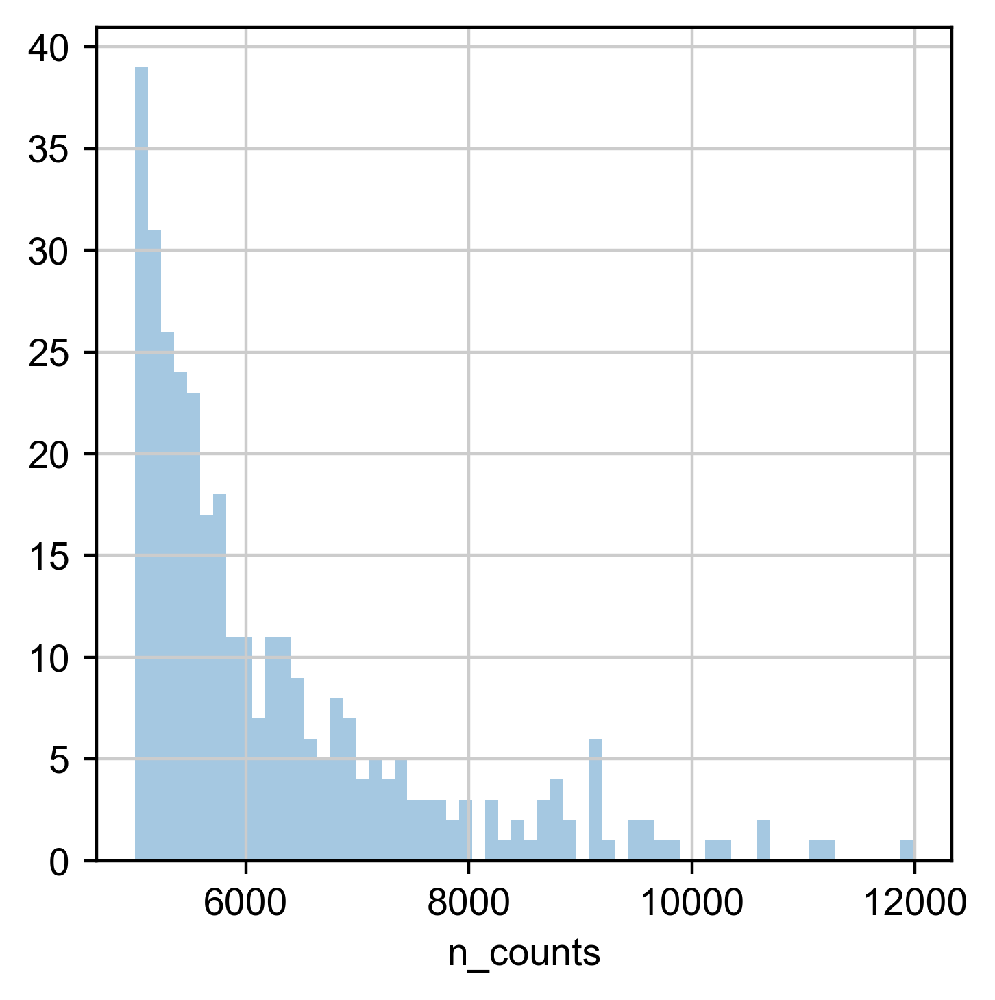

In [16]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<4000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>5000], kde=False, bins=60)
plt.show()

In [17]:
p5.get_figure().savefig("../Results/figures/discussion/dist_counts_selection.pdf")

## "Distplots-sample"

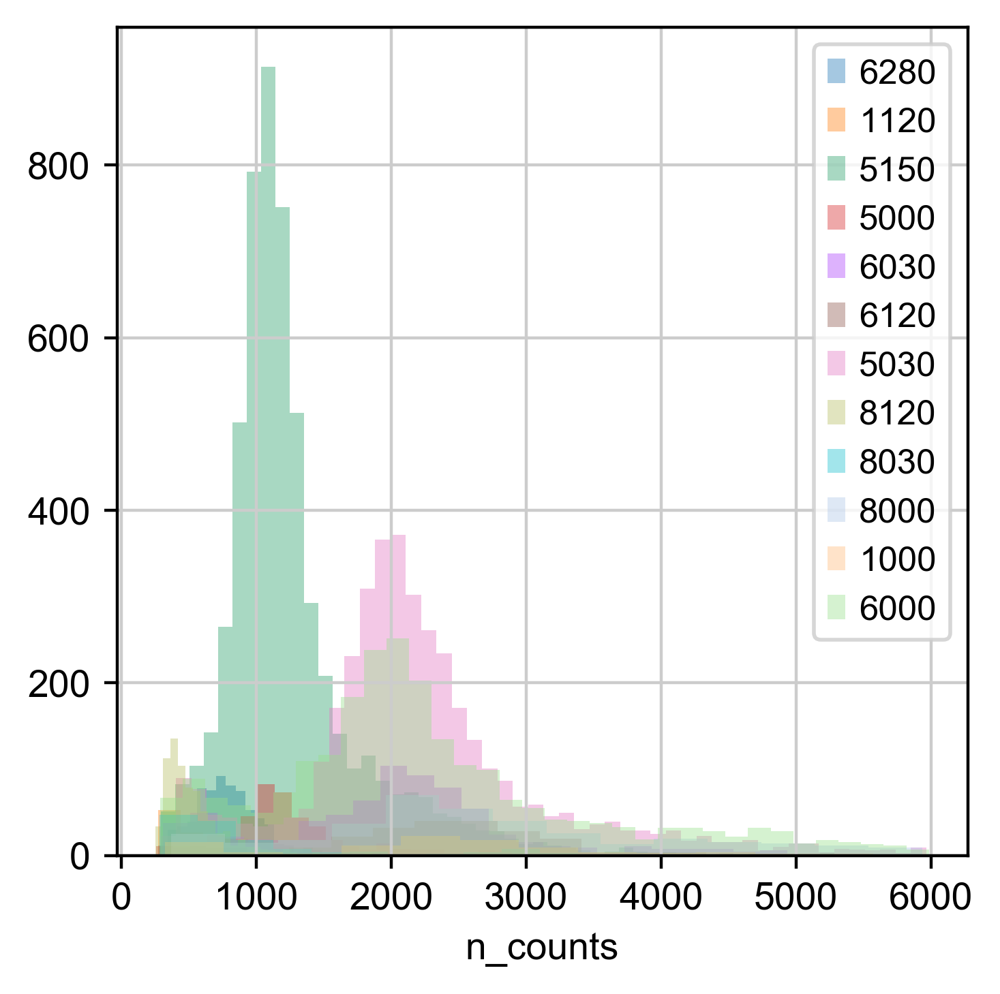

In [18]:
handles = []
plots = []
samplelist = list(set(adata.obs['patient.sample']))
for i in range(len(samplelist)):
    cdat = adata[adata.obs['patient.sample'] == samplelist[i]]
    handles.append(samplelist[i])
    plots.append(sb.distplot(cdat.obs['n_counts'][cdat.obs['n_counts']<6000], kde=False))
plt.legend(handles)
plt.savefig(resultfig_path + "dist_counts_sample_selection.pdf")
plt.show()

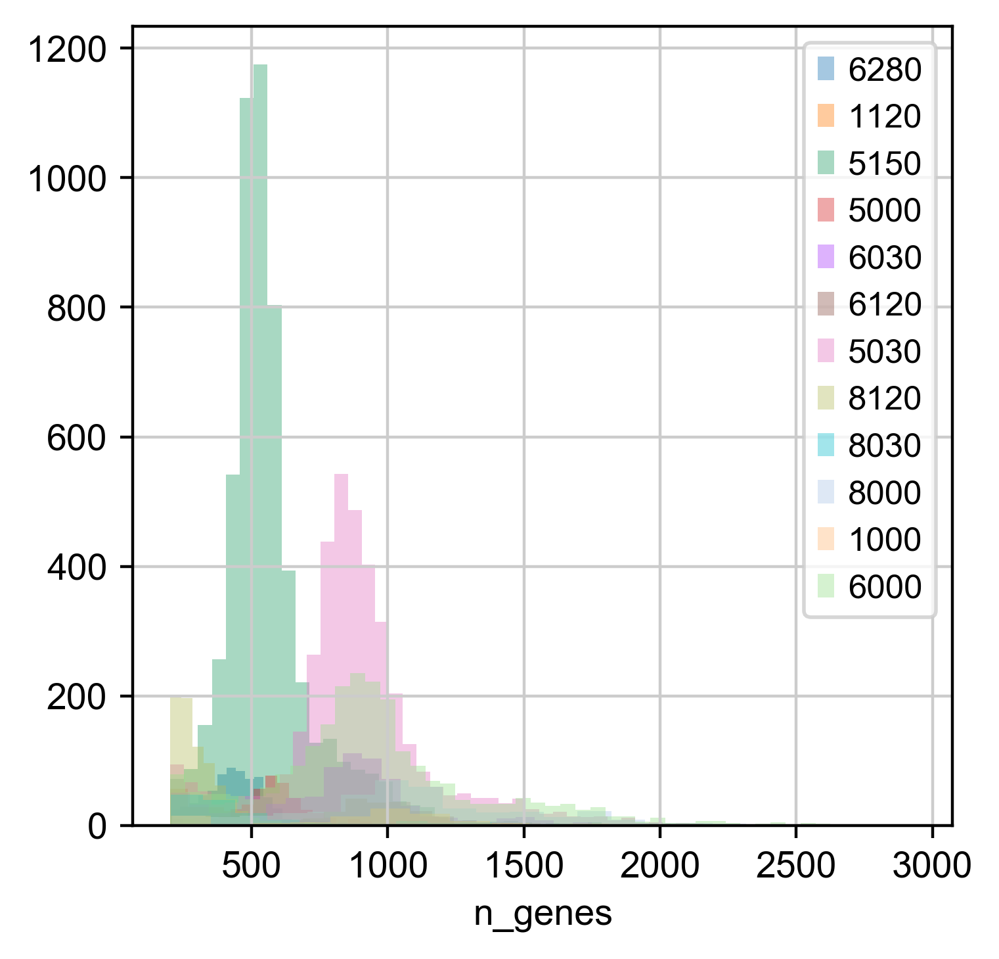

In [19]:
handles = []
plots = []
samplelist = list(set(adata.obs['patient.sample']))
for i in range(len(samplelist)):
    cdat = adata[adata.obs['patient.sample'] == samplelist[i]]
    handles.append(samplelist[i])
    plots.append(sb.distplot(cdat.obs['n_genes'], kde=False))
plt.legend(handles)
plt.savefig(resultfig_path + "dist_genes_sample_selection.pdf")
plt.show()

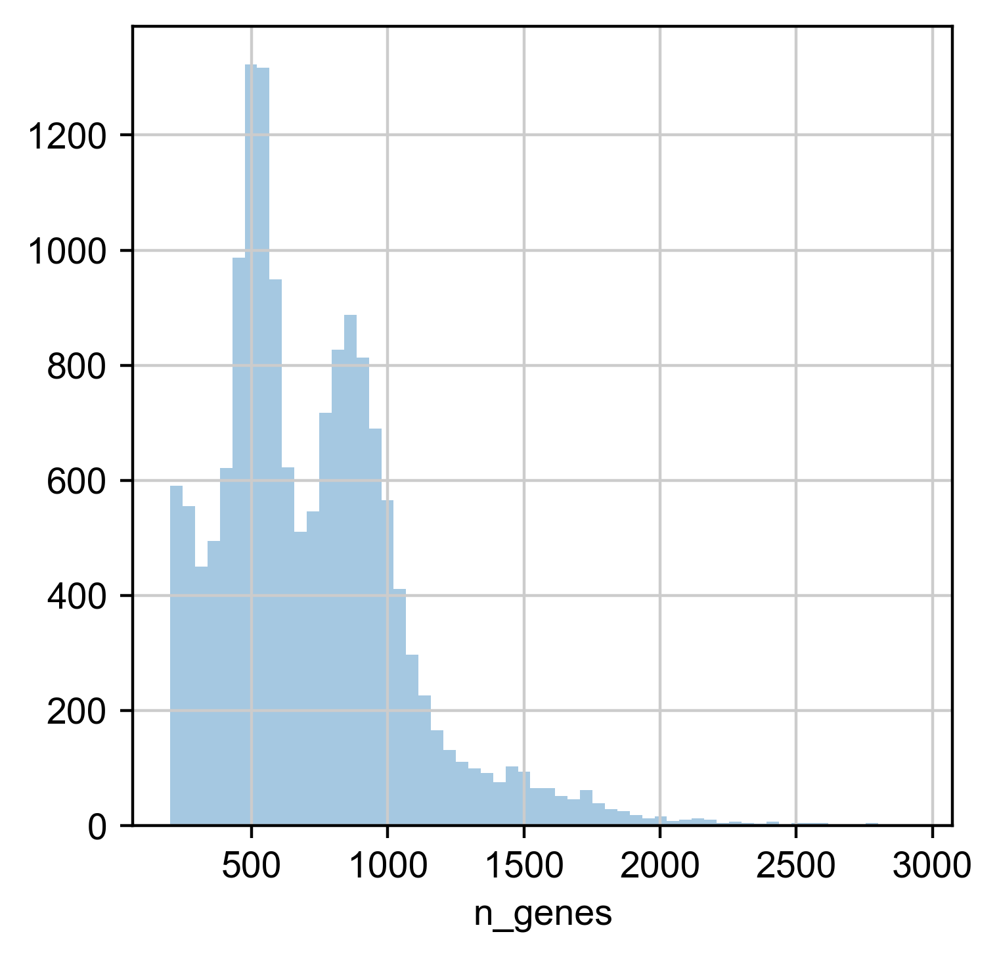

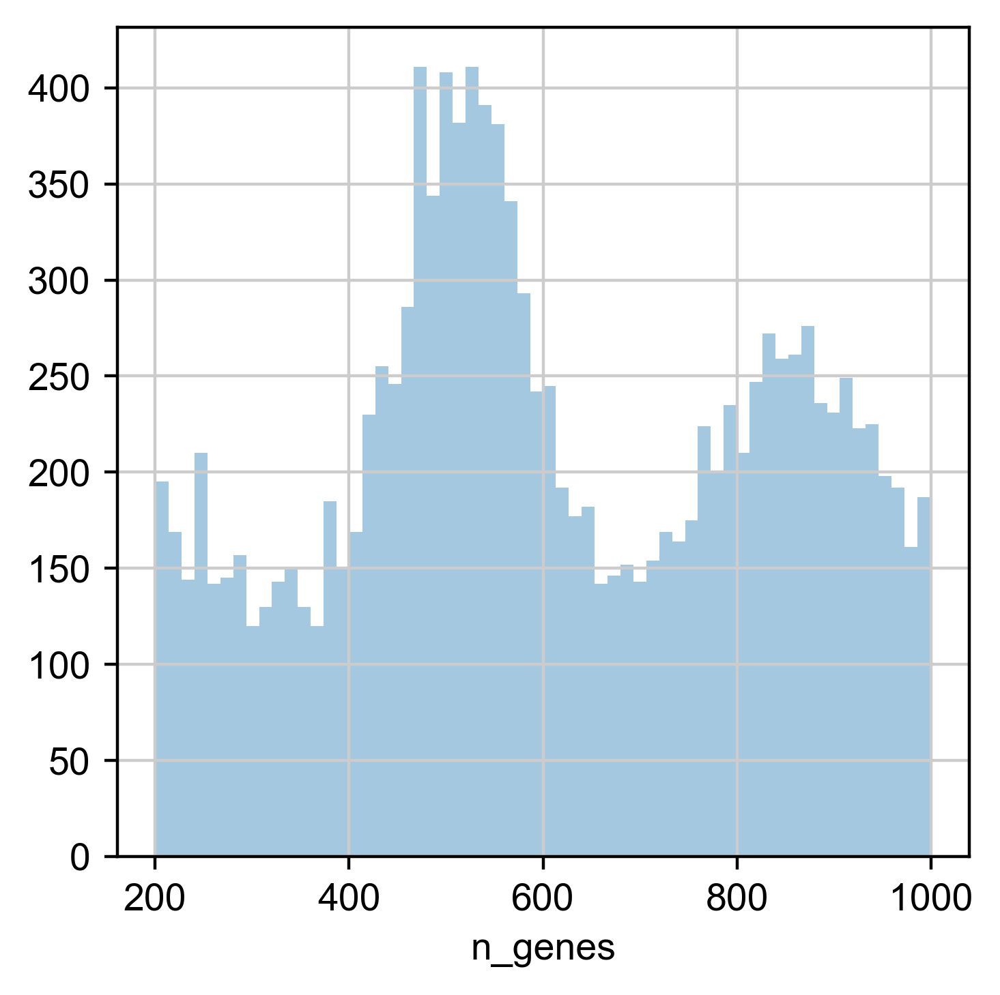

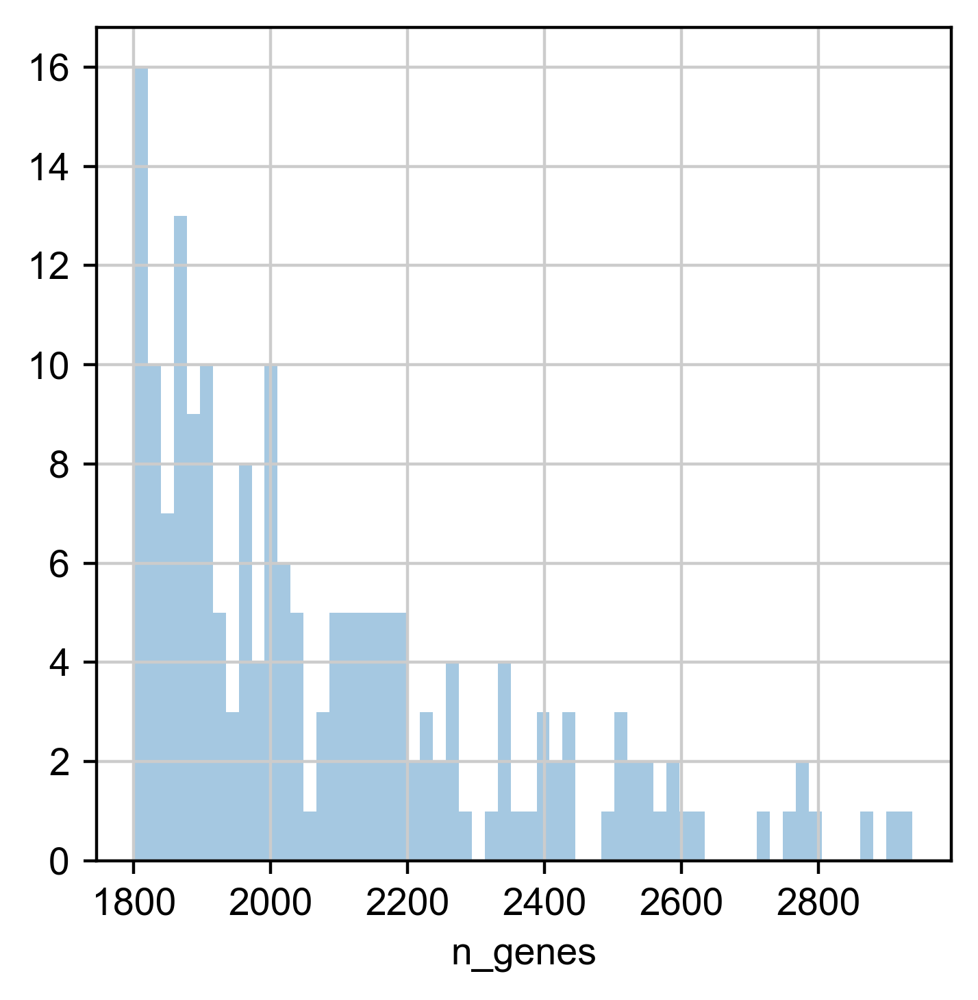

In [20]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes']<1000], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes']>1800], kde=False, bins=60)
plt.show()

In [21]:
p3.get_figure().savefig(resultfig_path + "dist_counts_selection.pdf")
p6.get_figure().savefig(resultfig_path + "dist_genes_selection.pdf")

In [22]:
# Filtering thresholds based on Rendeiro paper
adata = adata[adata.obs['mt_frac'] < 0.15]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))
sc.pp.filter_cells(adata, min_genes = 200)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))
sc.pp.filter_cells(adata, max_genes = 3000)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))

Number of cells after MT filter: 15784


Trying to set attribute `.obs` of view, making a copy.


Number of cells after gene filter: 15784
Number of cells after gene filter: 15784


In [23]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 22021
filtered out 9400 genes that are detected in less than 20 cells
Number of genes after cell filter: 12621


The filtering normaly is performed based on the thresholds we identified from the QC plots. In our case we chose thresholds just as Reneiro did, for reasons of comparaility.

<a id="Normalization"></a>

## 2.2 Normalization

> Up to this point the data is only available as a count matrix. Counts are representative of molecules that were captured in the scRNA-seq experiment. As not all mRNA molecules in a cell are captured, there is a variability in the total number of counts detected between cells that results from both the number of molecules that were in the cells, and the sampling. As we cannot assume that all cells contain an equal number of molecules (cell sizes can differ substantially), we have to estimate the number of molecules that were initially in the cells. In fact, we don't estimate the exact number of molecules, but instead estimate cell-specific factors that should be proportional to the true number of molecules. These are called size factors. Normalized expression values are calculated by dividing the measured counts by the size factor for the cell.

> Based on comparisons of normalization methods for differential testing (personal communication from Beathe Vieth), and batch correction [Buettner et al., 2019], the normalization method implemented in the scran package performs best. This method requires a coarse clustering input to improve size factor esimation performance. Thus, we use a simple preprocessing approach and cluster the data at a low resolution to get an input for the size factor estimation. The basic preprocessing includes assuming all size factors are equal (library size normalization to counts per million - CPM) and log-transforming the count data.

In [24]:
#Perform a clustering for scran normalization in clusters
adata_pp = adata.copy()
sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='groups', resolution=0.5)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 15
    finished (0:00:04.32)
computing neighbors
    using 'X_pca' with n_pcs = 15


C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\numba\typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\Anaconda3\envs\sc-tutorial\lib\site-packages\umap\rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\numba\typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\Anaconda3\envs\sc-tutoria

    finished (0:00:07.76) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:03.06) --> found 14 clusters and added
    'groups', the cluster labels (adata.obs, categorical)


In [25]:
#Preprocess variables for scran normalization
input_groups = adata_pp.obs['groups']
data_mat = adata.X.T

In [26]:
%%R -i data_mat -i input_groups -o size_factors

size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

In [27]:
#Delete adata_pp
del adata_pp

C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\scanpy\plotting\_anndata.py:311: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  x_arr = adata._get_obs_array(x, use_raw=use_raw, layer=layers[0])
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\anndata\core\anndata.py:1475: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarning
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\scanpy\plotting\_anndata.py:312: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  y_arr = adata._get_obs_array(y, use_raw=use_raw, layer=layers[1])
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\anndata\core\anndata.py:1475: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarn

saving figure to file ../Results/figures/selection/scatter_sizeVScounts_selection.pdf


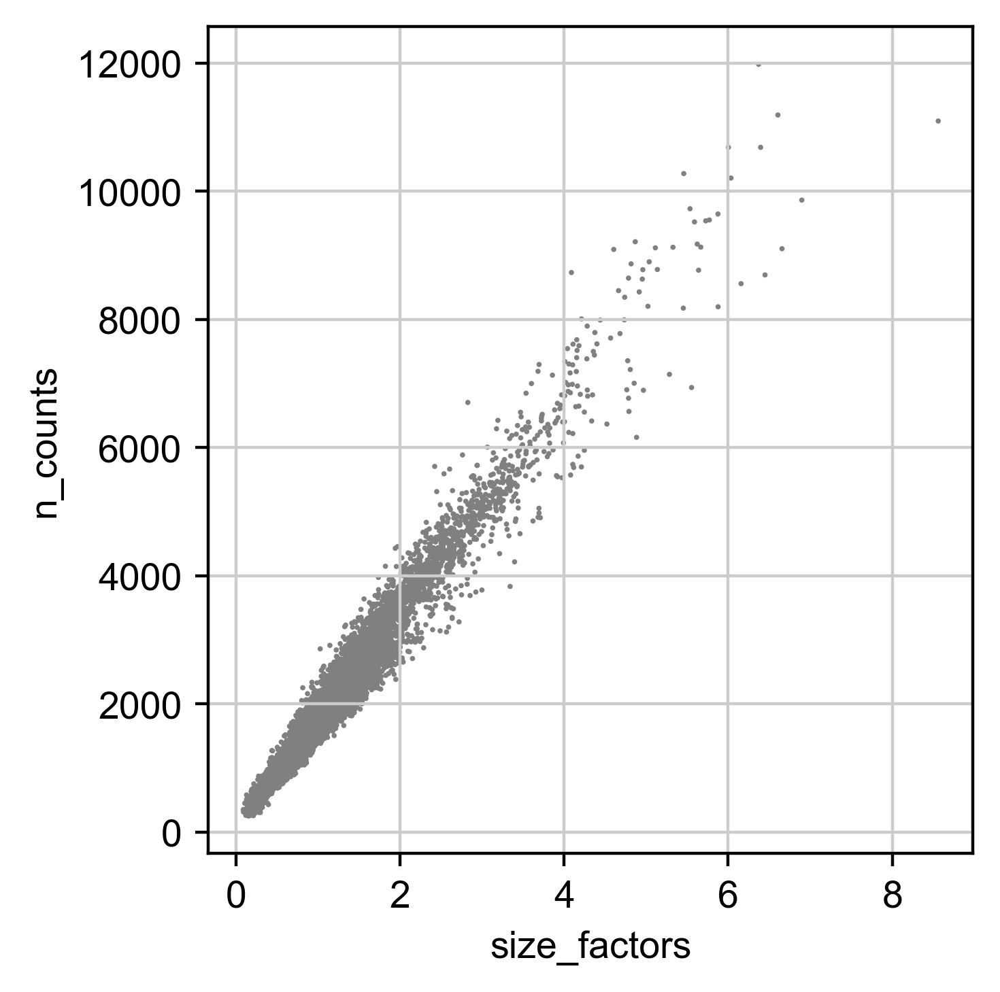

C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\scanpy\plotting\_anndata.py:311: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  x_arr = adata._get_obs_array(x, use_raw=use_raw, layer=layers[0])
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\anndata\core\anndata.py:1475: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarning
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\scanpy\plotting\_anndata.py:312: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  y_arr = adata._get_obs_array(y, use_raw=use_raw, layer=layers[1])
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\anndata\core\anndata.py:1475: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarn

saving figure to file ../Results/figures/selection/scatter_sizeVSgenes_selection.pdf


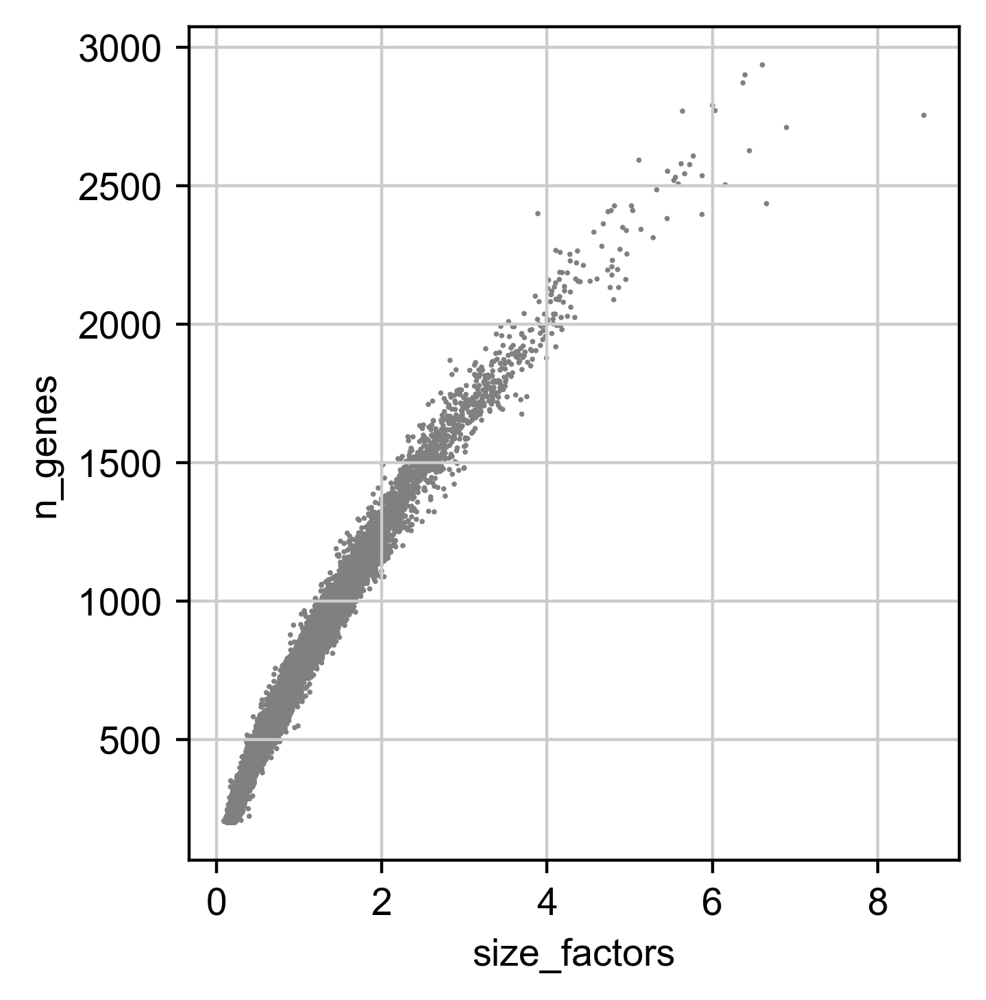

C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\scanpy\plotting\_anndata.py:311: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  x_arr = adata._get_obs_array(x, use_raw=use_raw, layer=layers[0])
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\anndata\core\anndata.py:1475: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarning
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\scanpy\plotting\_anndata.py:312: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  y_arr = adata._get_obs_array(y, use_raw=use_raw, layer=layers[1])
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\anndata\core\anndata.py:1475: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarn

saving figure to file ../Results/figures/selection/scatter_size_selection.pdf


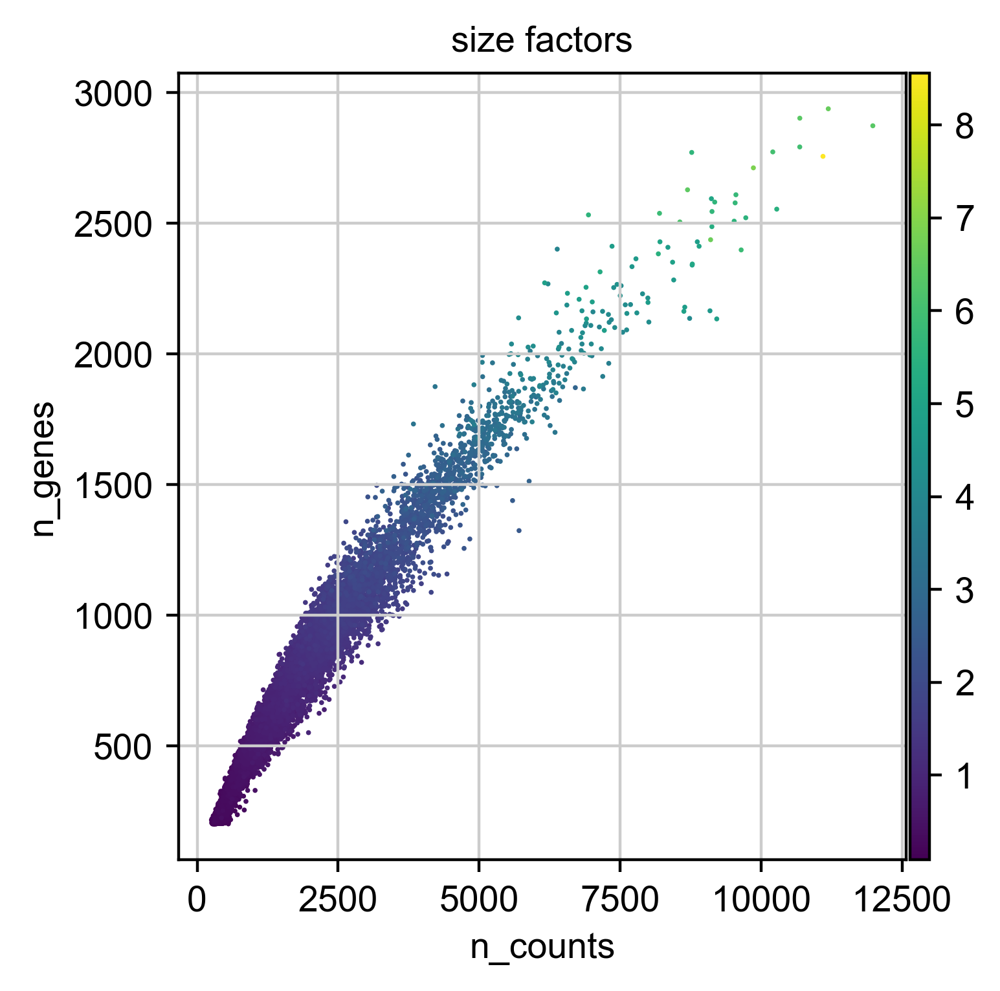

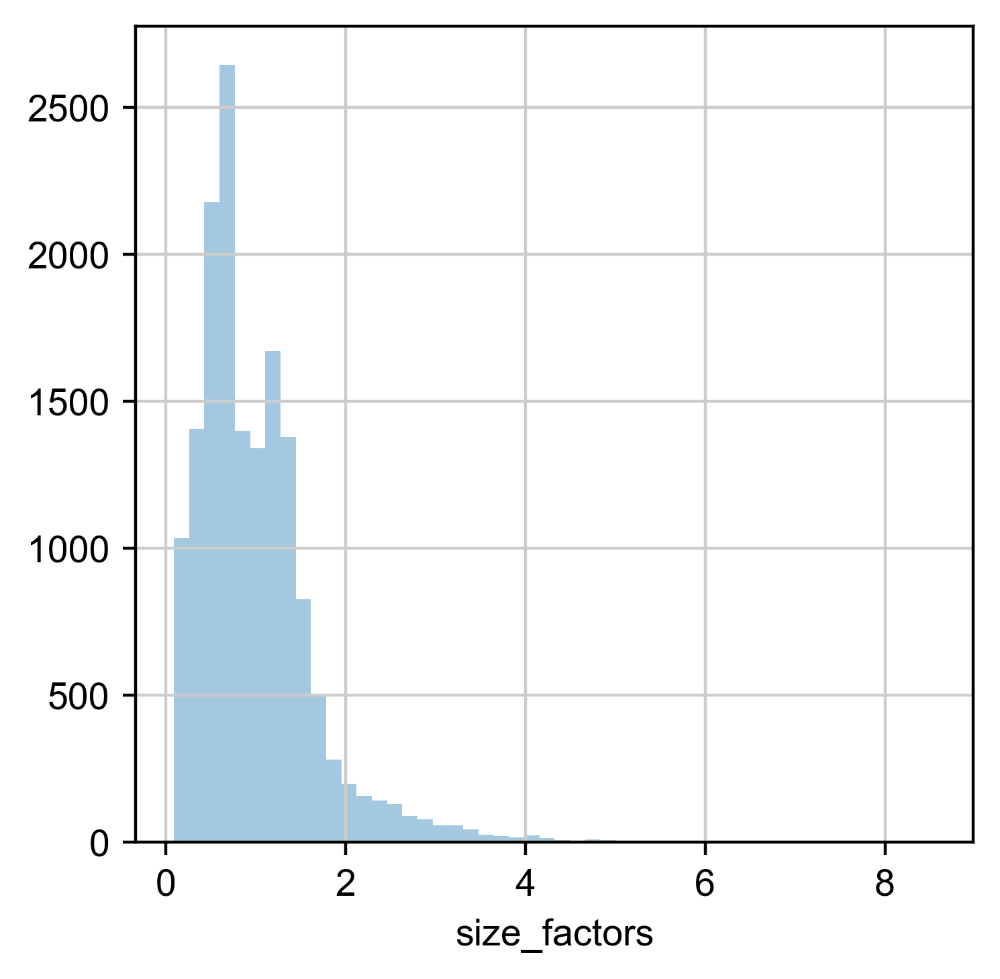

In [28]:
adata.obs['size_factors'] = size_factors

# Visualize the estimated size factors
sc.pl.scatter(adata, 'size_factors', 'n_counts', save="_sizeVScounts")
sc.pl.scatter(adata, 'size_factors', 'n_genes', save="_sizeVSgenes")
sc.pl.scatter(adata, 'n_counts', 'n_genes', color="size_factors", save="_size")

psdist = sb.distplot(adata.obs['size_factors'], bins=50, kde=False)
plt.show()

psdist.get_figure().savefig(resultfig_path + "dist_size_selection.pdf")

We plot the size factors to show they are non-negative and related to the number of counts and genes per cell as expected.

Before normalizing the data, we ensure that a copy of the raw count data is kept in a separate AnnData object. This allows us to use methods downstream that require this data as input.

In [29]:
#Keep the count data in a counts layer
adata.layers["counts"] = adata.X.copy()

In [30]:
#Normalize adata 
adata.X /= adata.obs['size_factors'].values[:,None]
sc.pp.log1p(adata)

In [31]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

In [32]:
helper = list(adata.X.sum(1))
print("Counts range from ", min(helper), " to ", max(helper))

Counts range from  327.56253  to  997.19525


The count data has been normalized and log-transformed with an offset of 1. The latter is performed to normalize the data distributions. The offset of 1 ensures that zero counts map to zeros. We keep this data in the '.raw' part of the AnnData object as it will be used to visualize gene expression and perform statistical tests such as computing marker genes for clusters.

<a id="HVG"></a>

<a id="Visualization"></a>

## 2.3 Visualization

> Visualizing scRNA-seq data is the process of projecting a high-dimensional matrix of cells and genes into a few coordinates such that every cell is meaningfully represented in a two-dimensional graph. However, the visualization of scRNA-seq data is an active area of research and each method defines 'meaningful' in its own way. Thus, it is a good idea to look at several visualizations and decide which visualization best represents the aspect of the data that is being investigated. 

> Overall t-SNE visualizations have been very popular in the community, however the recent UMAP algorithm has been shown to better represent the topology of the data.

> Note that we do not scale the genes to have zero mean and unit variance. A lack of rescaling is equivalent to giving genes with a higher mean expression a higher weight in dimensionality reduction (despite correcting for mean offsets in PCA, due to the mean-variance relationship). We argue that this weighting based on mean expression being a biologically relevant signal. However, rescaling HVG expression is also common, and the number of publications that use this approach suggests that scaling is at least not detrimental to downstream scRNA-seq analysis.

In [35]:
# Calculate the visualizations
sc.pp.pca(adata, n_comps=50, use_highly_variable=False, svd_solver='arpack') #pcs for first 50 main components
sc.pp.neighbors(adata)

sc.tl.tsne(adata, n_jobs=12) #Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata)
sc.tl.diffmap(adata)
sc.tl.draw_graph(adata)

computing PCA with n_comps = 50
    finished (0:00:24.14)
computing neighbors
    using 'X_pca' with n_pcs = 50


C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\numba\typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\Anaconda3\envs\sc-tutorial\lib\site-packages\umap\rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
C:\Users\Bobi\Anaconda3\envs\sc-tutorial\lib\site-packages\numba\typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\Anaconda3\envs\sc-tutoria

    finished (0:00:09.55) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished (0:03:07.03) --> added
    'X_tsne', tSNE coordinates (adata.obsm)
computing UMAP
    using 'X_pca' with n_pcs = 50
    finished (0:00:11.12) --> added
    'X_umap', UMAP coordinates (adata.obsm)
computing Diffusion Maps using n_comps=15(=n_dcs)
    eigenvalues of transition matrix
    [1.         0.9989679  0.99584574 0.9917197  0.98959786 0.98322326
     0.9823595  0.9817043  0.981186   0.9765804  0.9621266  0.9577744
     0.95493233 0.9531303  0.9511881 ]
    finished (0:00:00.49) --> added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns)
drawing single-cell graph using layout "fa"
    finished (0:19:06.28) --> added
    'X_draw_graph_fr', g

saving figure to file ../Results/figures/selection/umap_genes_selection.pdf


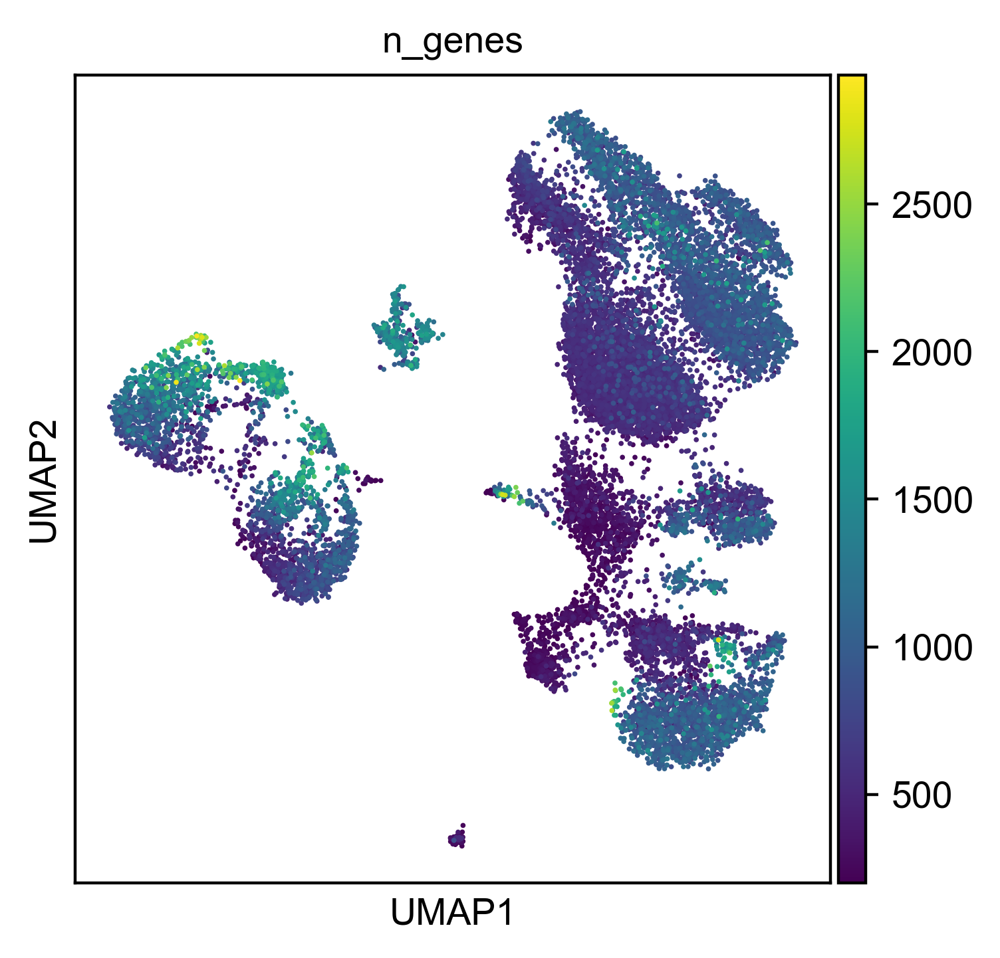

In [34]:
sc.pl.umap(adata, color='n_genes', save='_genes')

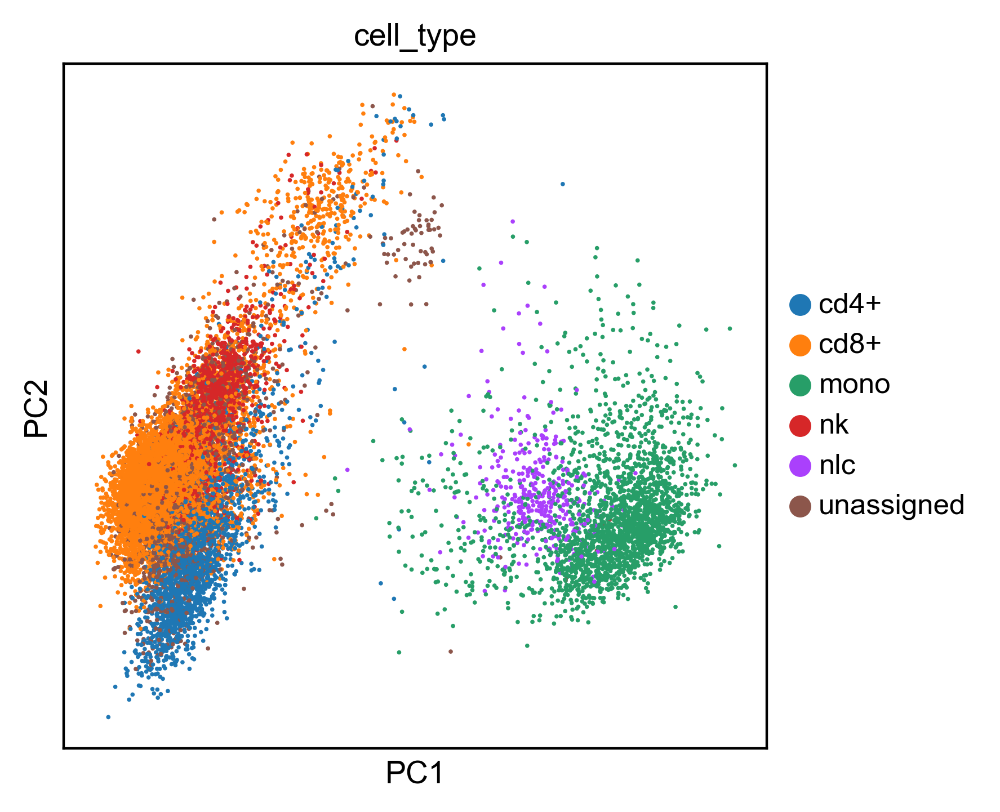

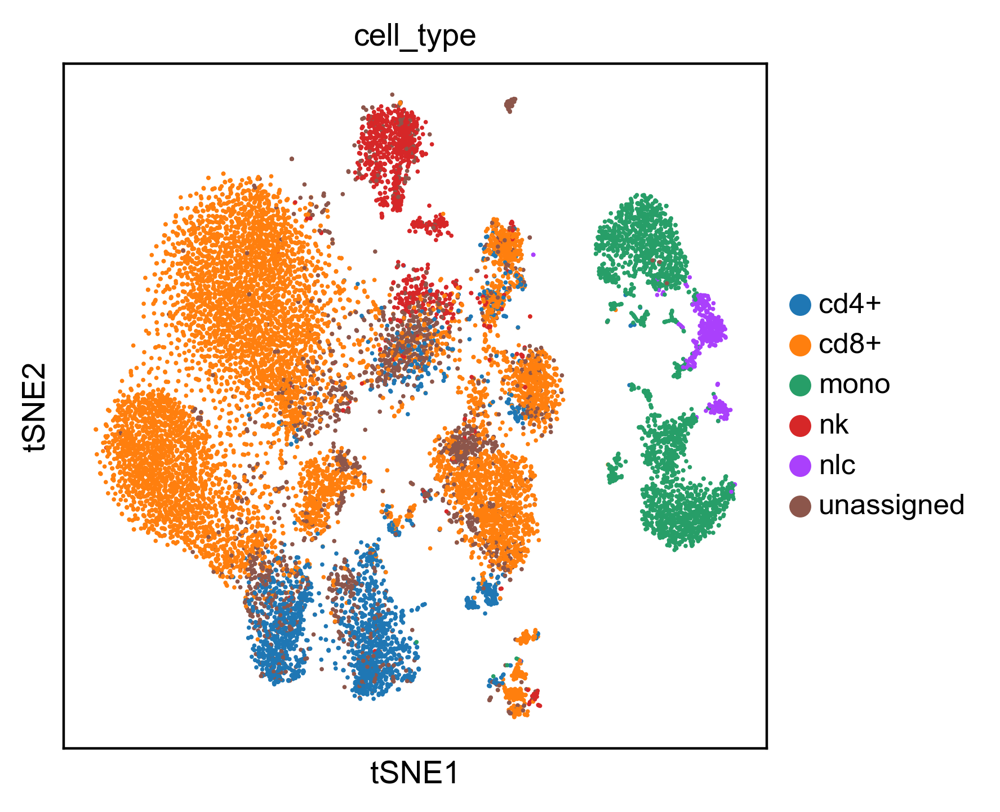

saving figure to file ../Results/figures/selection/umap_celltype_selection.pdf


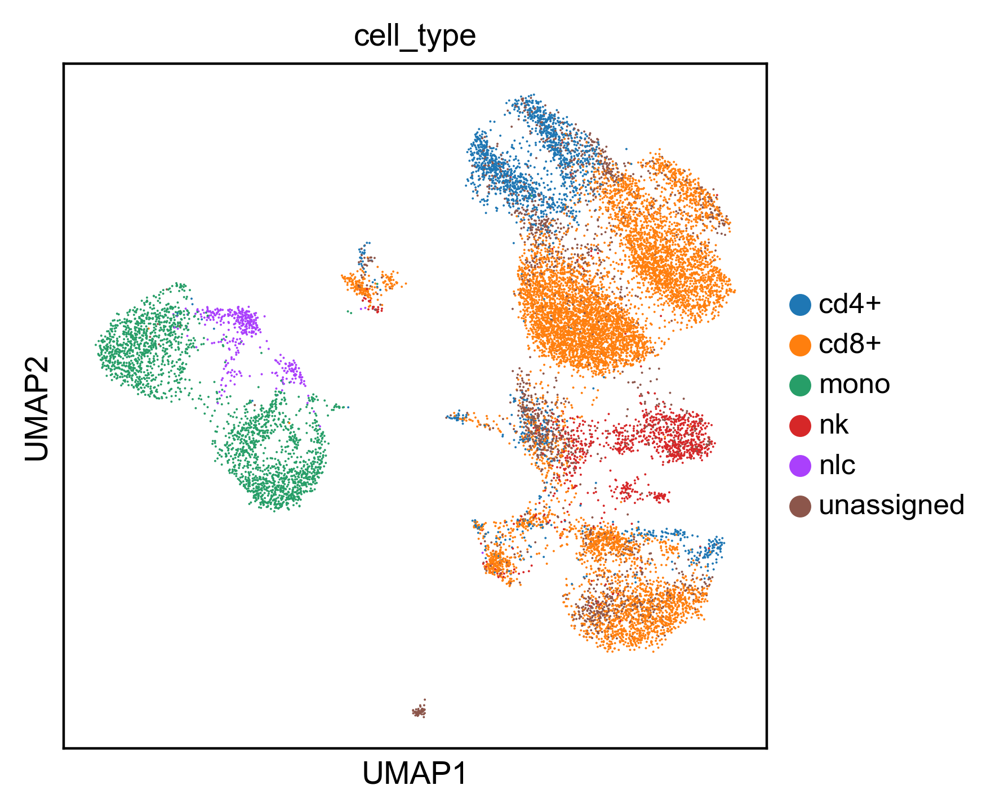

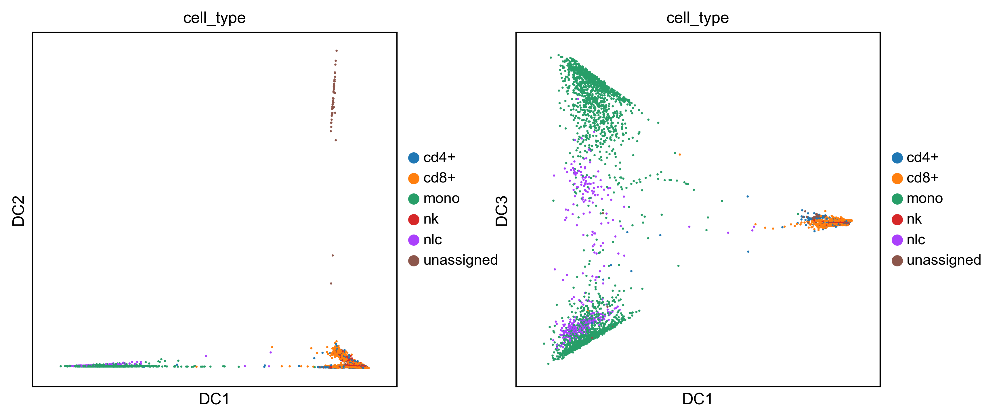

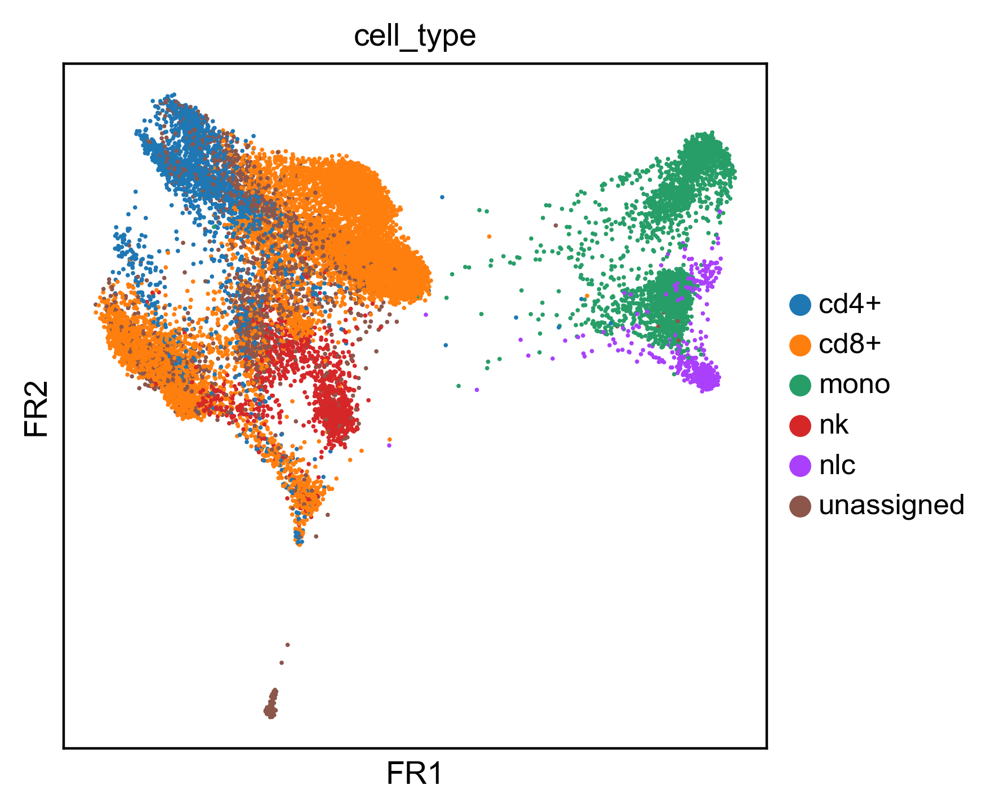

In [35]:
sc.pl.pca_scatter(adata, color='cell_type')
sc.pl.tsne(adata, color='cell_type')
sc.pl.umap(adata, color='cell_type', save='_celltype', size=2)
sc.pl.diffmap(adata, color='cell_type', components=['1,2','1,3'])
sc.pl.draw_graph(adata, color='cell_type')

<a id="CC"></a>

# 3 Downstream analysis

<a id="Clustering"></a>

## 3.1 Clustering

> Clustering is a central component of the scRNA-seq analysis pipeline. To understand the data, we must identify cell types and states present. The first step of doing so is clustering. Performing Modularity optimization by Louvain community detection on the k-nearest-neighbour graph of cells has become an established practice in scRNA-seq analysis. Thus, this is the method of choice in this tutorial as well.

> Here, we perform clustering at two resolutions. Investigating several resolutions allows us to select a clustering that appears to capture the main clusters in the visualization and can provide a good baseline for further subclustering of the data to identify more specific substructure.

> Clustering is performed on the highly variable gene data, dimensionality reduced by PCA, and embedded into a KNN graph. (see `sc.pp.pca()` and `sc.pp.neighbors()` functions used in the visualization section.

In [36]:
# Perform clustering - using highly variable genes
sc.tl.louvain(adata, key_added='louvain_r1')
sc.tl.louvain(adata, resolution=0.5, key_added='louvain_r0.5')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:03.13) --> found 16 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:04.32) --> found 11 clusters and added
    'louvain_r0.5', the cluster labels (adata.obs, categorical)


In [37]:
adata.obs['louvain_r0.5'].value_counts()

0     3604
1     2560
2     2287
3     2042
4     1354
5     1271
6      993
7      822
8      534
9      264
10      53
Name: louvain_r0.5, dtype: int64

saving figure to file ../Results/figures/selection/umap_louvainr1_selection.pdf


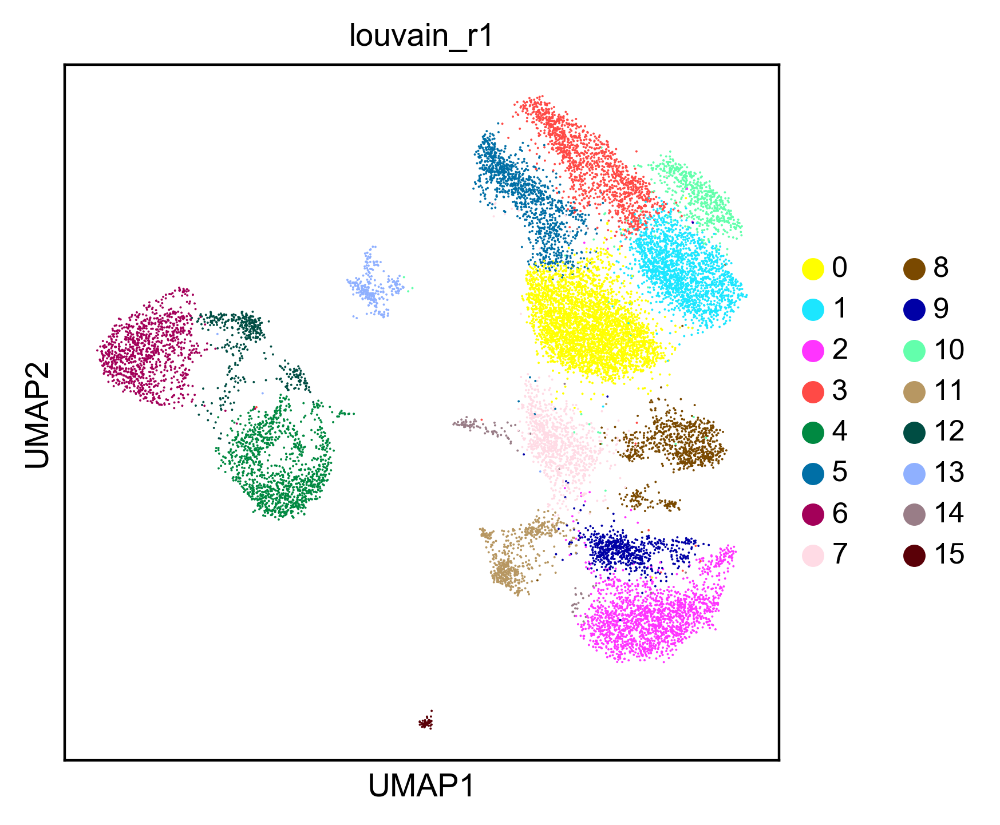

saving figure to file ../Results/figures/selection/umap_louvainr05_selection.pdf


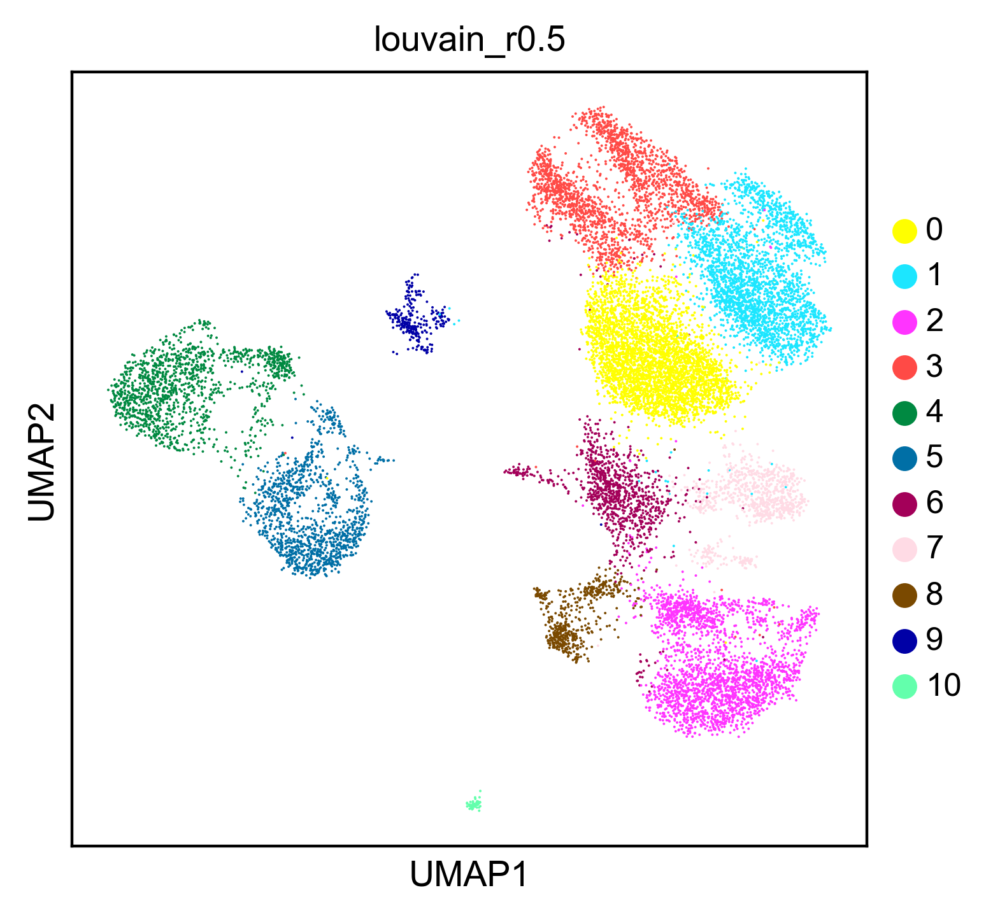

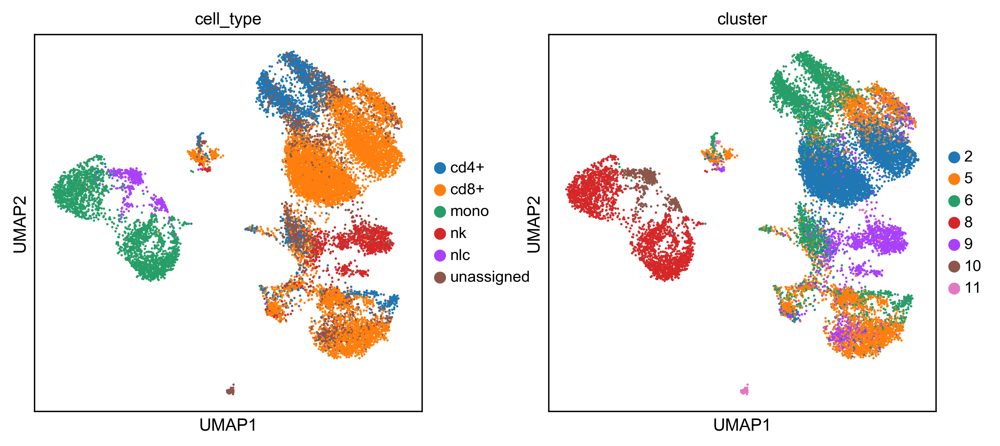

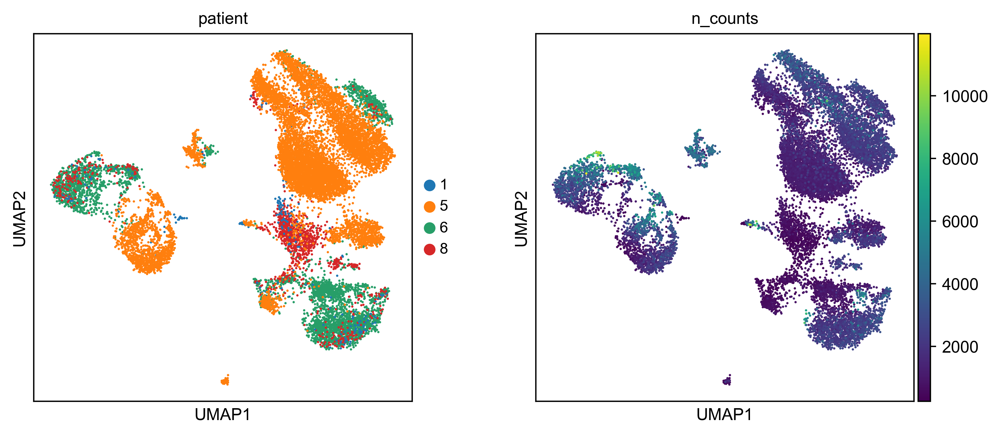

In [38]:
#Visualize the clustering and how this is reflected by different technical covariates
sc.pl.umap(adata, color=['louvain_r1'], palette=sc.pl.palettes.default_64, size=2, save='_louvainr1')
sc.pl.umap(adata, color=['louvain_r0.5'], palette=sc.pl.palettes.default_64, size=2, save='_louvainr05')
sc.pl.umap(adata, color=['cell_type', 'cluster'])
sc.pl.umap(adata, color=['patient', 'n_counts'])

<a id="Markers"></a>

## 3.2 Marker genes & cluster annotation

> To annotate the clusters we obtained, we find genes that are up-regulated in the cluster compared to all other clusters (marker genes). This differential expression test is performed by a Welch t-test with overestimated variance to be conservative. This is the default in scanpy. The test is automatically performed on the `.raw` data set, which is uncorrected and contains all genes. All genes are taken into account, as any gene may be an informative marker.

Option for automated annotation:
* **scmap**
* **garnett**

In [39]:
#Calculate marker genes
# https://scanpy.readthedocs.io/en/stable/api/scanpy.tl.rank_genes_groups.html#scanpy.tl.rank_genes_groups
# https://github.com/theislab/scanpy/blob/master/scanpy/tools/_rank_genes_groups.py
# 
# t-test with overestimated variance of each group
# corr_method: benjamini-hochberg
# n_genes = (100)

# Rank all genes per Cluster
sc.tl.rank_genes_groups(adata, method='t-test', groupby='louvain_r0.5', key_added='rank_genes_r0.5', n_genes=adata.n_vars)

ranking genes
    finished (0:00:10.70) --> added to `.uns['rank_genes_r0.5']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


In [40]:
# Build signiture gene lists for each cluster using a adjusted p-value cutoff of <= 0.05
sig_cluster_genes = dict()

for c in set(adata.obs['louvain_r0.5']):
    sig_cluster_genes[c] = adata.uns['rank_genes_r0.5']['names'][c][adata.uns['rank_genes_r0.5']['pvals_adj'][c]<=0.05]

In [42]:
markerinfo = pd.read_csv("../Data/marker/pbmc_marker.csv")

In [43]:
# Build celltype marker dictionary for all pbmc celltype from CellMarker.com
temp_marker = dict()
for i in range(len(markerinfo['cellName'])):
    temp_celltype = markerinfo['cellName'][i]
    if temp_celltype not in temp_marker:
        temp_marker[temp_celltype] = markerinfo['cellMarker'][i].split(", ")
    else:
        temp_marker[temp_celltype] += markerinfo['cellMarker'][i].split(", ")

celltype_marker = dict()
for ct in temp_marker:
    temp_ctmarker = set(temp_marker[ct]).intersection(set(adata.var['gene_id']))
    if len(temp_ctmarker) > 3: 
        if ct == 'Regulatory T (Treg) cell':
            celltype_marker['Regulatory T cell'] = temp_ctmarker
        elif ct == 'Effector CD8+ memory T (Tem) cell':
            celltype_marker['Memory T cell'] = temp_ctmarker
        else:
            celltype_marker[ct] = temp_ctmarker

In [44]:
# number of expressed marker genes for each pbmc celltype
len(celltype_marker)
for ct in celltype_marker:
    if len(celltype_marker[ct]) < 15:
        print(ct + ": " + str(celltype_marker[ct]))
    else:
        print(ct + ": " + str(len(celltype_marker[ct])))

T cell: {'CD3G', 'CD28', 'CD3D', 'CD27', 'CD3E'}
CD4+ T cell: {'CD4', 'IL2RA', 'CTLA4', 'FOXP3'}
CD8+ T cell: {'CD4', 'GZMK', 'CD8A', 'CD8B'}
Regulatory T cell: 44
B cell: {'MS4A1', 'CD37', 'CD19', 'CD79B', 'BLNK', 'CD79A'}
Macrophage: {'CD14', 'CD163', 'FCGR3A', 'CD68', 'CSF1R'}
Natural killer cell: {'CD247', 'KLRF1', 'NKG7', 'FCGR3A', 'KLRK1', 'KLRB1', 'CCL3', 'GZMB', 'NCAM1', 'FCGR3B', 'GNLY', 'KLRC1', 'KLRD1', 'CD160'}
Naive T cell: {'CCR7', 'CD27', 'CD8A', 'CD8B'}
Naive CD8+ T cell: 87
Memory T cell: 83
Naive CD4+ T cell: 32


In [45]:
# build heatmap with pvalues from fisher exact testing each celltype markers for each cluster
heatmap_data = dict()
all_genes = adata.var_names.tolist()
for current_cluster in ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10']:
    current_sig_genes = sig_cluster_genes[current_cluster] #cluster marker genes (all significantly differentially expressed genes in this cluster)
    current_non_sig_genes = np.setdiff1d(all_genes, current_sig_genes).tolist() # all other genes that are not cluster marker
    cluster_values = []
    for current_celltype in celltype_marker:
        current_celltype_marker = celltype_marker[current_celltype] # all celltype marker genes for current celltype
        non_marker = np.setdiff1d(all_genes, list(current_celltype_marker)).tolist() # all genes that are not celltype markers for current celltype
        marker_and_significant = len(current_celltype_marker.intersection(current_sig_genes))
        non_marker_but_significant = len(set(non_marker).intersection(current_sig_genes))
        marker_but_not_significant = len(current_celltype_marker.intersection(current_non_sig_genes))
        non_marker_and_not_significant = len(set(non_marker).intersection(current_sig_genes))
        # build table for fisher's exact test
        table = [[marker_and_significant, marker_but_not_significant],[non_marker_but_significant, non_marker_and_not_significant]]
        oddsratio, pvalue = sp.stats.fisher_exact(table, alternative='greater')
        cluster_values.append(pvalue)
    heatmap_data[current_cluster] = cluster_values

In [46]:
df = pd.DataFrame.from_dict(heatmap_data)
df.index = list(celltype_marker.keys())

## "heatmap"

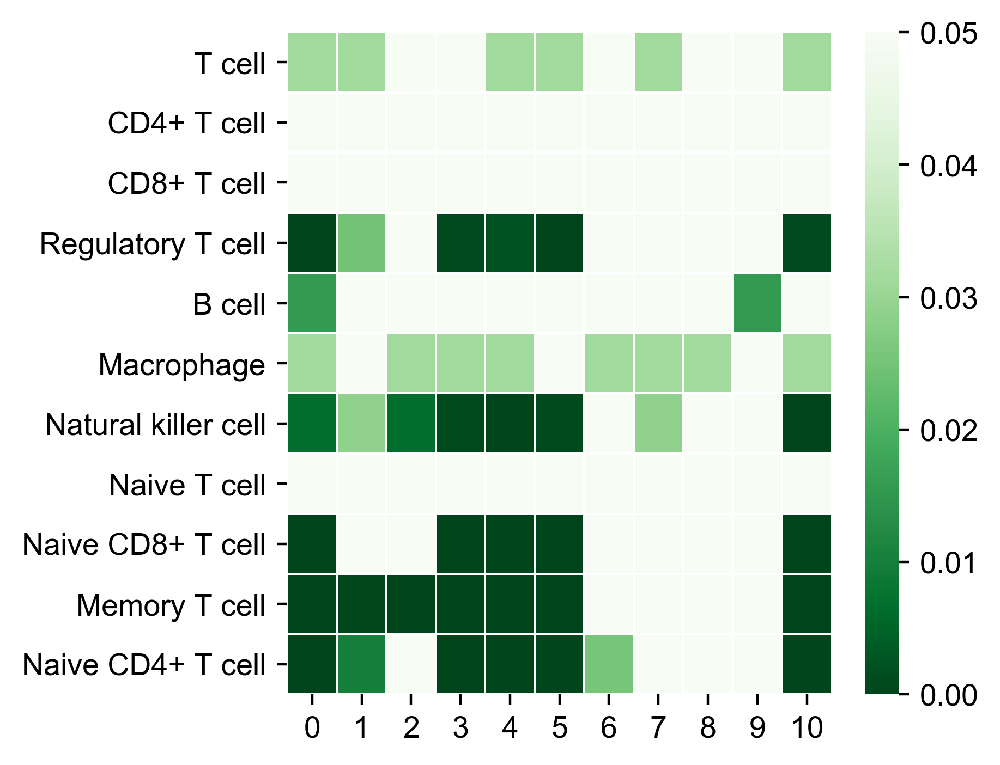

In [47]:
phm = sb.heatmap(df, linewidth = 0.5, cmap="Greens_r", vmin=0, vmax=0.05)

# fix for mpl bug that cuts off top/bottom of seaborn viz
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.show()

phm.get_figure().savefig(resultfig_path + "heatmap_celltypes_selection.pdf", bbox_inches="tight")

In [50]:
celltype_annotation = df.idxmin(axis = 0)
print(celltype_annotation)

0           Memory T cell
1           Memory T cell
2           Memory T cell
3           Memory T cell
4           Memory T cell
5           Memory T cell
6       Naive CD4+ T cell
7     Natural killer cell
8              Macrophage
9                  B cell
10          Memory T cell
dtype: object


In [51]:
# we want to leave out memory t cells from cluster annotation, as memory t cells represent a very differentiated cell type
df1 = df.drop(['Memory T cell'])
cta = df1.idxmin(axis=0)
cluster_annot = cta.to_dict()
print(cluster_annot)

{'0': 'Naive CD8+ T cell', '1': 'Naive CD4+ T cell', '2': 'Natural killer cell', '3': 'Naive CD4+ T cell', '4': 'Naive CD8+ T cell', '5': 'Naive CD8+ T cell', '6': 'Naive CD4+ T cell', '7': 'Natural killer cell', '8': 'Macrophage', '9': 'B cell', '10': 'Naive CD8+ T cell'}


In [52]:
#Categories to rename
adata.obs['louvain_r0.5'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], dtype='object')

In [53]:
adata.rename_categories('louvain_r0.5', ['Naive CD8+ T cell 1',
                                         'Naive CD4+ T cell 1',
                                         'Natural killer cell 1',
                                         'Naive CD4+ T cell 2',
                                         'Naive CD8+ T cell 2',
                                         'Naive CD8+ T cell 3',
                                         'Naive CD4+ T cell 3',
                                         'Natural killer cell 2',
                                         'Macrophage',
                                         'B cell',
                                         'Naive CD8+ T cell 4'])

saving figure to file ../Results/figures/selection/umap_louvainr05_celltypes_selection.pdf


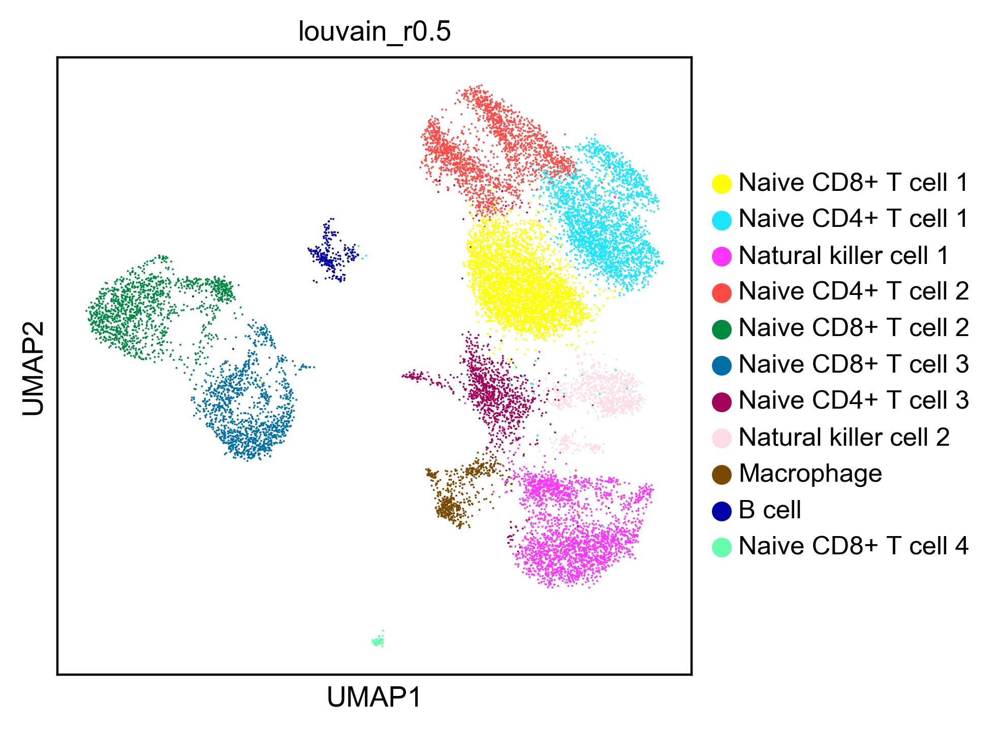

In [54]:
sc.pl.umap(adata, color=['louvain_r0.5'], palette=sc.pl.palettes.default_64, size=2, save='_louvainr05_celltypes')

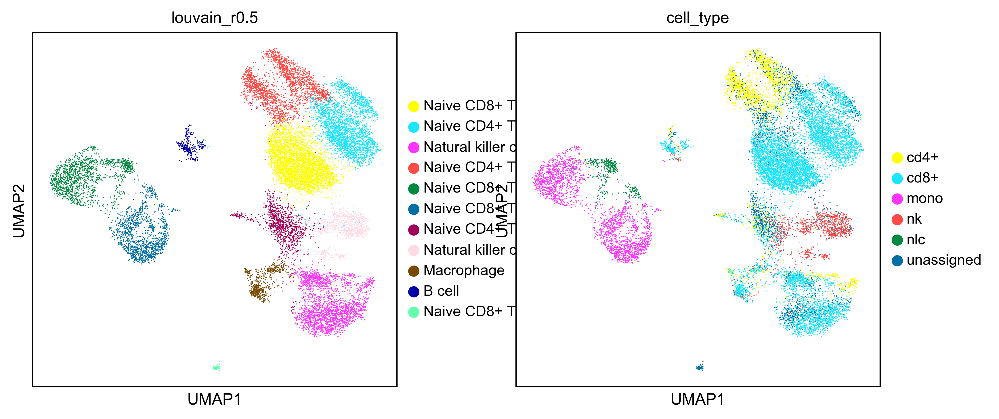

In [55]:
sc.pl.umap(adata, color=['louvain_r0.5','cell_type'], palette=sc.pl.palettes.default_64, size=2)

In [56]:
#comparison between our annotation and celltype labels from Rendeiro
ct_annot_new = list()
for i in adata.obs['louvain_r0.5']:
    if i.startswith('Natural'):
        ct_annot_new.append('nk')
    elif i.startswith('Naive CD8+'):
        ct_annot_new.append('cd8+')
    elif i.startswith('Naive CD4+'):
        ct_annot_new.append('cd4+')
    elif i.startswith('Macro'):
        ct_annot_new.append('macro')
    elif i.startswith('B'):
        ct_annot_new.append('B')
adata.obs['cell_type_annot'] = ct_annot_new

In [57]:
print("Rendeiro:")
print(adata.obs['cell_type'].value_counts()/adata.n_obs)
print("our label:")
print(adata.obs['cell_type_annot'].value_counts()/adata.n_obs)

Rendeiro:
cd8+          0.533452
mono          0.141472
unassigned    0.120882
cd4+          0.114736
nk            0.064876
nlc           0.024582
Name: cell_type, dtype: float64
our label:
cd8+     0.397998
cd4+     0.354473
nk       0.196972
macro    0.033832
B        0.016726
Name: cell_type_annot, dtype: float64


<a id="Gene_set"></a>

###  Gene ontology analysis

> This analysis is performed with g:profiler, or specifically with Valentine Svensson's python API for the g:profiler webtool. It should be noted that g:profiler's python API is currently being redesigned and thus the old python API (used here) is no longer supported and updated. To use the newest GO data, please check with the g:profiler team.

The results for gene ontology analysis (GOA) could not be reproduced until now.
Further annotation via GOA tends to be very subjective.
For valid results that allow deduction for celltype labels this method has to be elaborated in more detail.

In [59]:
sig_genes_cluster = sig_cluster_genes

In [60]:
from gprofiler_plotting import plot_enrich

gp = GProfiler(return_dataframe=True, user_agent='g:GOSt')

In [61]:
# here we build 3 dictionaries for different search options of gene ontology database, storing the results for cluster marker genes
# in the end we store responses from gene ontology in one combined dictionary
enrichments_bp = dict()

for cluster in sig_genes_cluster.keys():
    enrichments_bp[cluster] = gp.profile(organism='hsapiens', sources=['GO:BP'], user_threshold=0.05,
                               significance_threshold_method='fdr', 
                               background=adata.var_names.tolist(), 
                               query=sig_genes_cluster[cluster].tolist())

enrichments_mf = dict()

for cluster in sig_genes_cluster.keys():
    enrichments_mf[cluster] = gp.profile(organism='hsapiens', sources=['GO:MF'], user_threshold=0.05,
                               significance_threshold_method='fdr', 
                               background=adata.var_names.tolist(), 
                               query=sig_genes_cluster[cluster].tolist())
enrichments_cc = dict()

for cluster in sig_genes_cluster.keys():
    enrichments_cc[cluster] = gp.profile(organism='hsapiens', sources=['GO:CC'], user_threshold=0.05,
                               significance_threshold_method='fdr', 
                               background=adata.var_names.tolist(), 
                               query=sig_genes_cluster[cluster].tolist())
enrichments = dict()
for cluster in sig_genes_cluster.keys():
    cEnr = []
    for enr in [enrichments_bp, enrichments_mf, enrichments_cc]:
        cEnr.append(enr[cluster].set_index('native').sort_values('recall', ascending=False).iloc[:50,[2,5,7,10,1]])
    enrichments[cluster] = cEnr

In [69]:
# example of response for cluster '5' and GO term 'biological process'
pd.set_option("display.max_colwidth", 800)

enrichments['5'][0]

,p_value,term_size,intersection_size,recall,name
native,,,,,
GO:0070233,2.311444e-02,12,12,1.000000,negative regulation of T cell apoptotic process
GO:0043374,2.311444e-02,12,12,1.000000,"CD8-positive, alpha-beta T cell differentiation"
GO:1900103,2.311444e-02,12,12,1.000000,positive regulation of endoplasmic reticulum unfolded protein response
GO:0008207,1.438557e-02,13,13,1.000000,C21-steroid hormone metabolic process
GO:0032930,1.438557e-02,13,13,1.000000,positive regulation of superoxide anion generation
GO:0045414,3.642836e-02,11,11,1.000000,regulation of interleukin-8 biosynthetic process
GO:0032802,3.642836e-02,11,11,1.000000,low-density lipoprotein particle receptor catabolic process
GO:0048569,3.642836e-02,11,11,1.000000,post-embryonic animal organ development
GO:1900101,2.028028e-03,22,21,0.954545,regulation of endoplasmic reticulum unfolded protein response


We can display the above results in a more appealing way using a dotplot. This plotting scheme is similar to the one in the clusterProfiler R package.

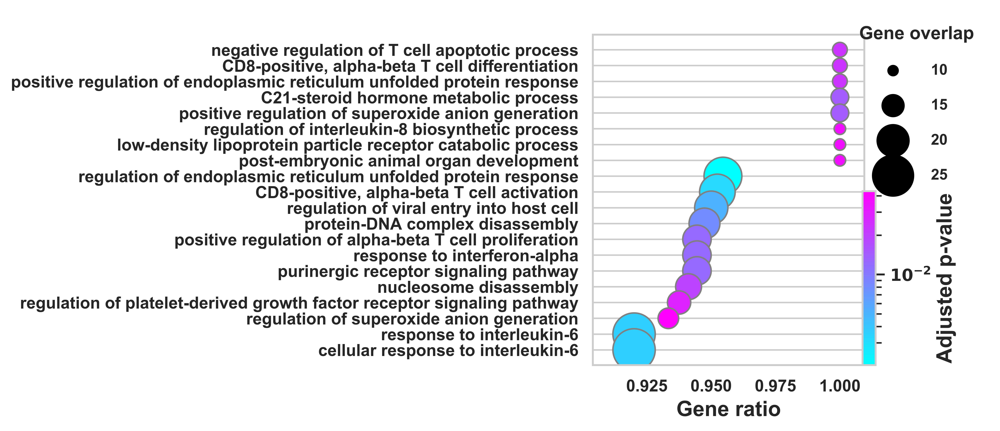

In [70]:
# example GO-analysis plot cluster '5' and GO term 'biological process'
sc.set_figure_params(dpi_save=300, dpi=400, fontsize=6)
plot_enrich(enrichments['5'][0])

In the above plot the number of differentially expressed genes (DEGs) that share a particular GO term is represented by the size of the datapoint, the color shows the FDR-corrected p-value, and the x-axis is the ratio of genes in the full DEG set that contain the particular annotation.

## Data integration

https://satijalab.org/seurat/v3.0/immune_alignment.html

https://osca.bioconductor.org/integrating-datasets.html